In [1]:
!pip install torch transformers umap-learn seaborn

In [2]:
# Imports
from transformers import AutoModelForSequenceClassification, AutoTokenizer

import random, os, json
from itertools import product
from collections import defaultdict

from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.utils.data as data

import numpy as np
import umap
import matplotlib.pyplot as plt
import seaborn as sns

MODEL_NAME = "./codebert-base-mlm"

In [3]:
# Load dataset

f = open("./data/packet_inspection/packets_dataset.jsonl", "r")
ai_dataset = [json.loads(line) for line in f.readlines()]
f.close()

In [4]:
# Getting Data activations

model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, output_hidden_states=True)
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
layer = 10

inputs = [s["text"] for s in ai_dataset]
tokens_id = tokenizer(inputs, padding=True, truncation=True, return_tensors="pt")
activations =  model(**tokens_id).hidden_states


In [5]:
class SAE(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(SAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dim, input_dim),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded, encoded

In [6]:
# Utility functions for SAE analysis

def get_feature_directions(W_dec):
    """
    Calcola i vettori di direzione delle feature a partire dalla matrice dei pesi del decoder.

    Args:
        W_dec (torch.Tensor): Pesi del decoder di forma (D, F), dove
                              D è la dimensione residua e F la dimensione delle feature.

    Returns:
        torch.Tensor: I vettori delle feature (direzioni normalizzate), di forma (D, F).
    """
    feature_directions = F.normalize(W_dec, p=2, dim=0, eps=1e-8)
    
    return feature_directions

def get_feature_activations(x, W_enc, b_enc, W_dec):
    """
    Calcola le attivazioni delle feature per un dato input x.

    Args:
        x (torch.Tensor): Tensore dei dati di input, di forma (batch_size, D).
        W_enc (torch.Tensor): Pesi dell'encoder, di forma (F, D).
        b_enc (torch.Tensor): Bias dell'encoder, di forma (F,).
        W_dec (torch.Tensor): Pesi del decoder, di forma (D, F).

    Returns:
        torch.Tensor: Le attivazioni delle feature, di forma (batch_size, F).
    """
    # Calcolo delle attivazioni dei feature (f_i(x) = ReLU(W_enc * x + b_enc))
    f_x = torch.relu(torch.matmul(x, W_enc.T) + b_enc)
    
    norm_W_dec = torch.linalg.norm(W_dec, dim=0)
    
    feature_activations = f_x * norm_W_dec
    
    return feature_activations

In [7]:
hidden_dims = [768, 768*2, 768*4, 768*8, 768*16, 768*32] 
layer = 10
beta = 5.0
lr = 5e-5
input_dim = 768

-------- standard --------


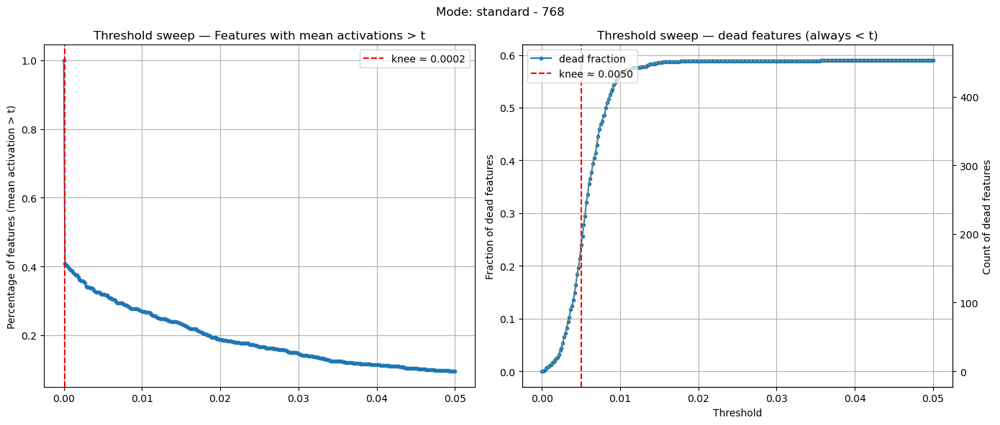

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.005016722250729799


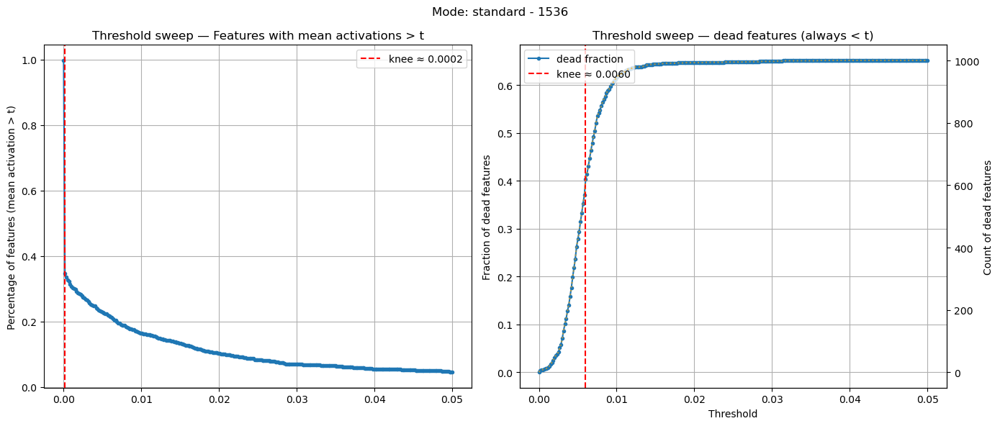

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.006020066794008017


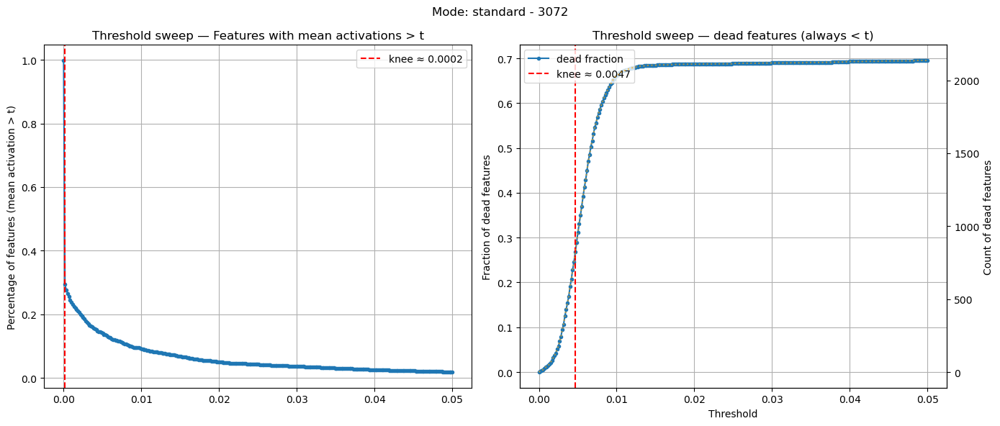

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.00468227406963706


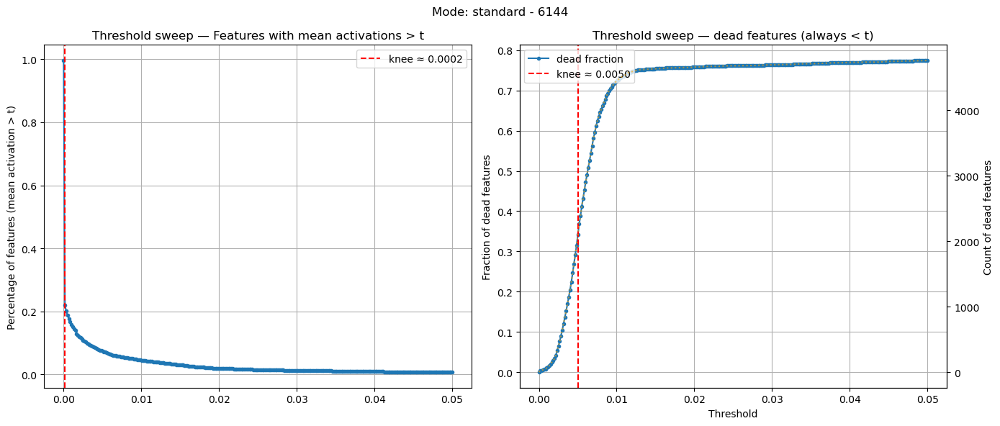

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.005016722250729799


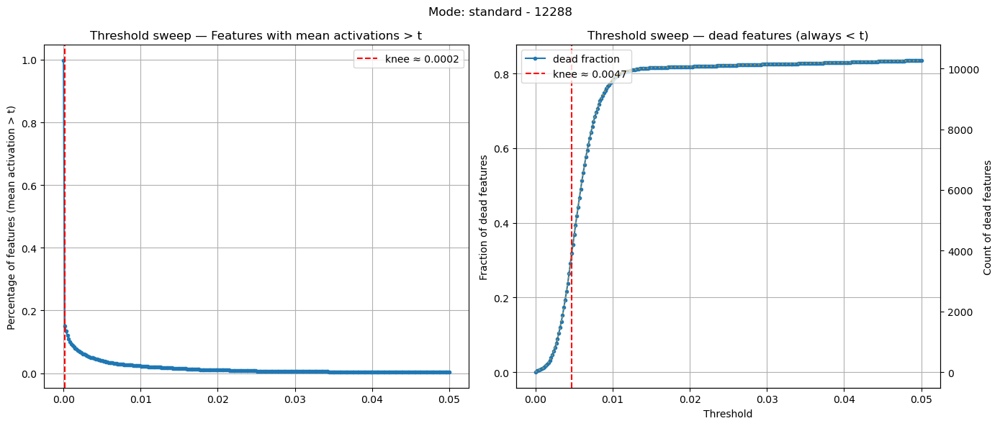

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.00468227406963706


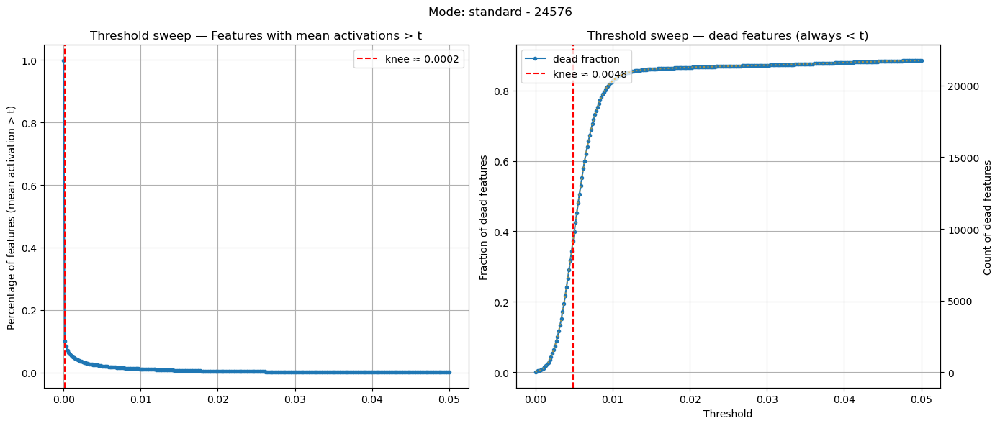

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.00484949816018343
-------- full --------


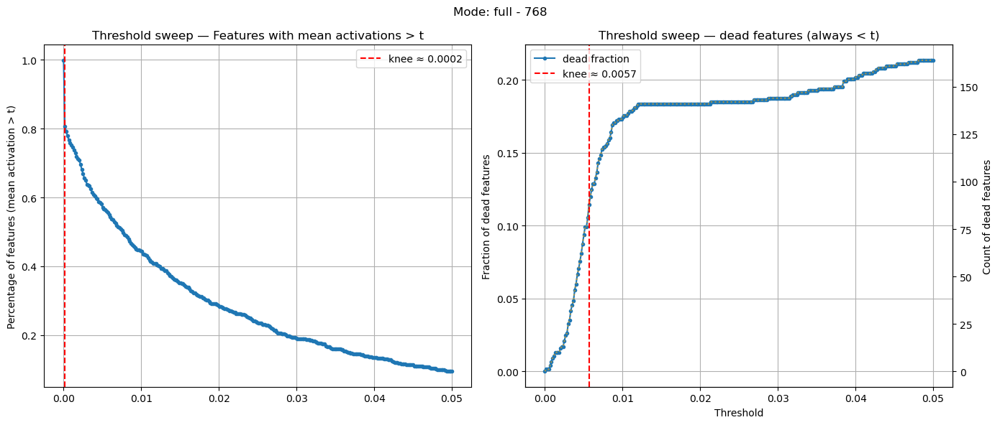

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.0056856186129152775


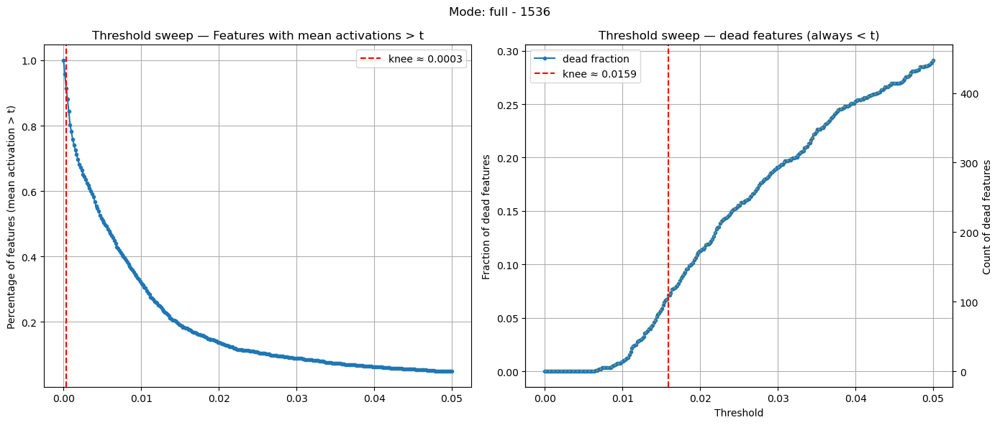

Knee (percent_live): 0.00033444815198890865
Knee (dead_fraction): 0.01588628813624382


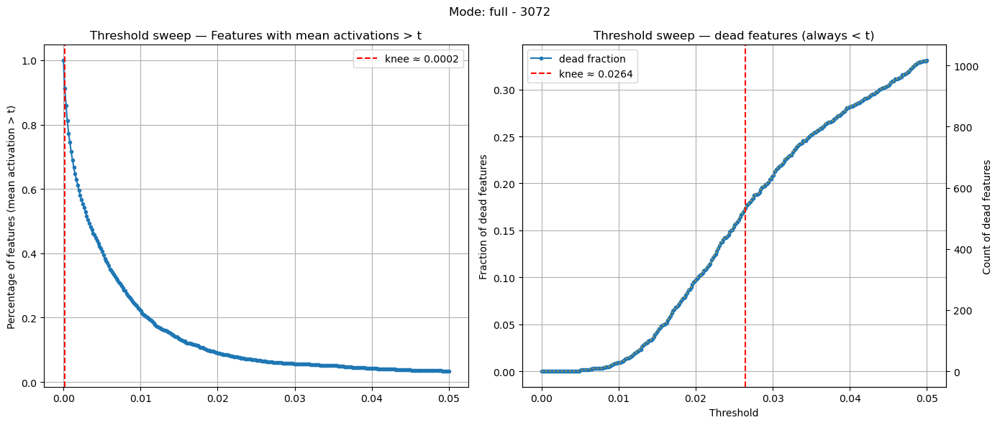

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.026421405375003815


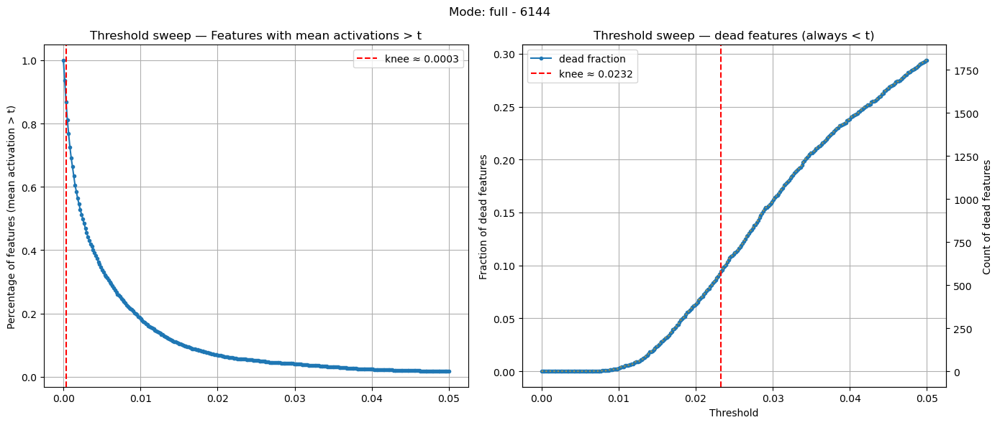

Knee (percent_live): 0.00033444815198890865
Knee (dead_fraction): 0.02324414625763893


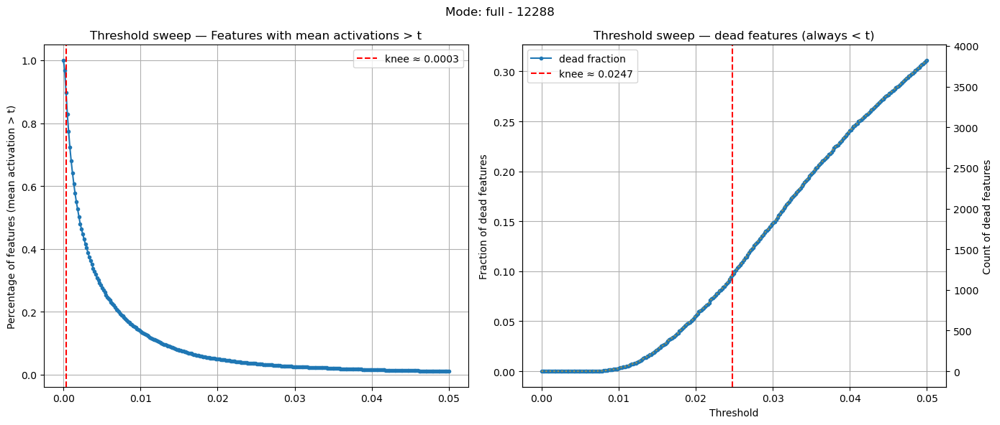

Knee (percent_live): 0.00033444815198890865
Knee (dead_fraction): 0.024749163538217545


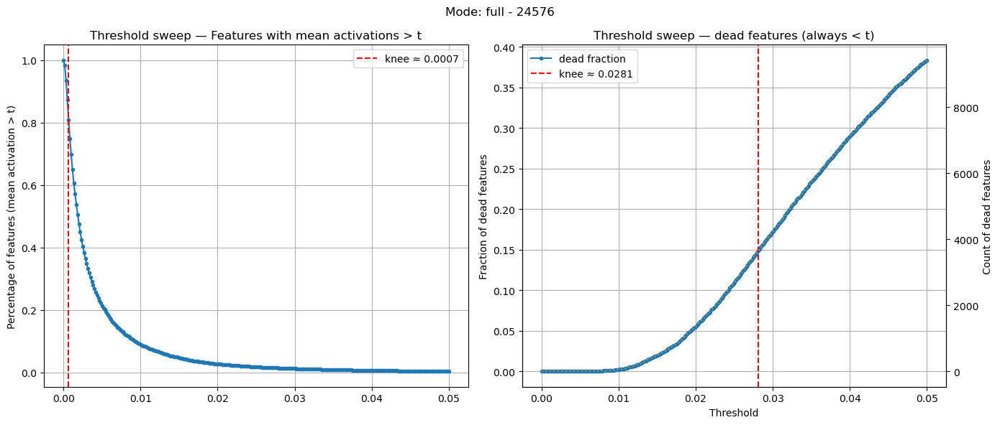

Knee (percent_live): 0.0006688963039778173
Knee (dead_fraction): 0.028093647211790085
-------- new --------


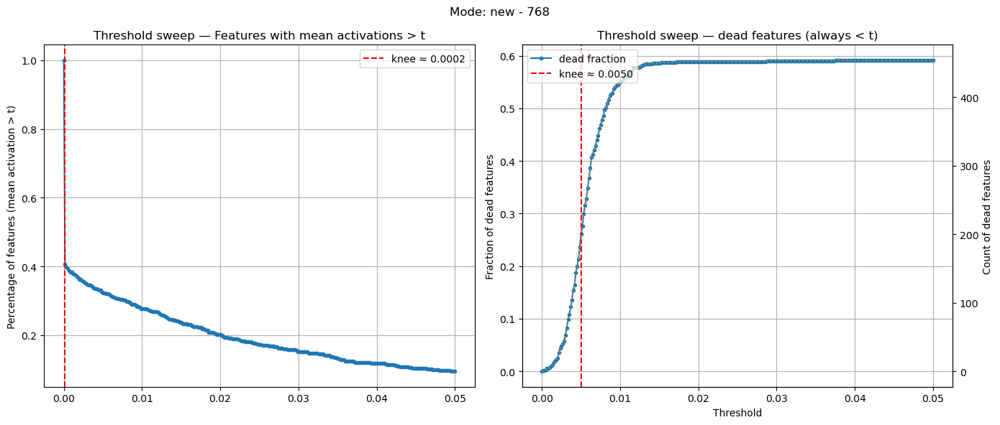

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.005016722250729799


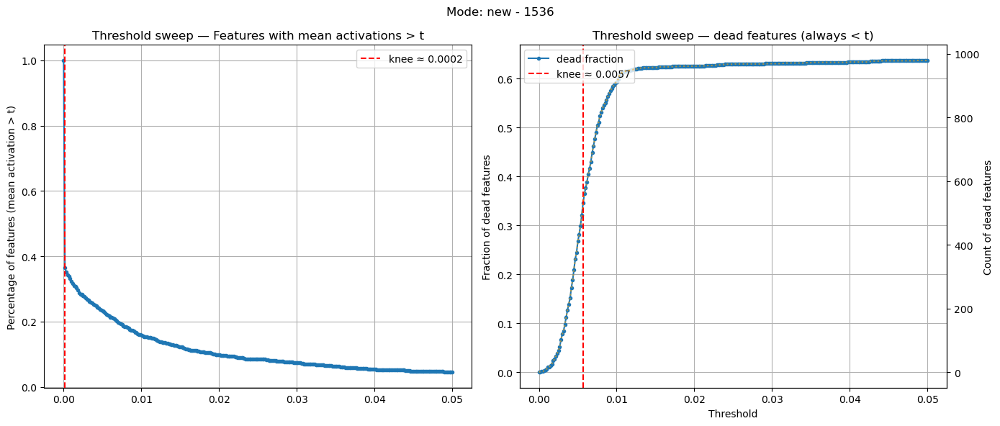

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.0056856186129152775


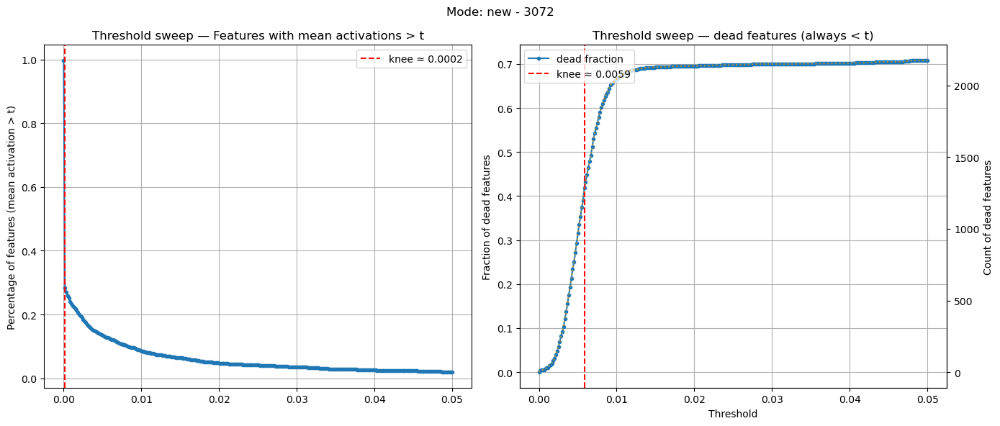

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.005852842703461647


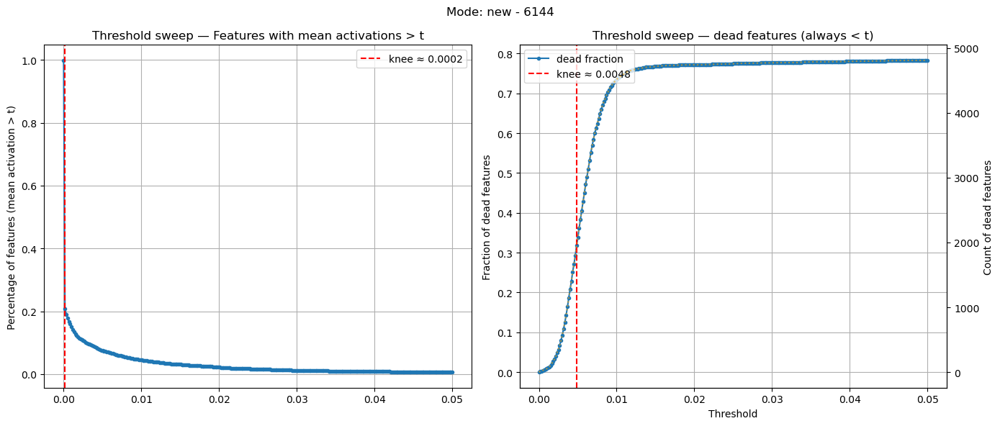

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.00484949816018343


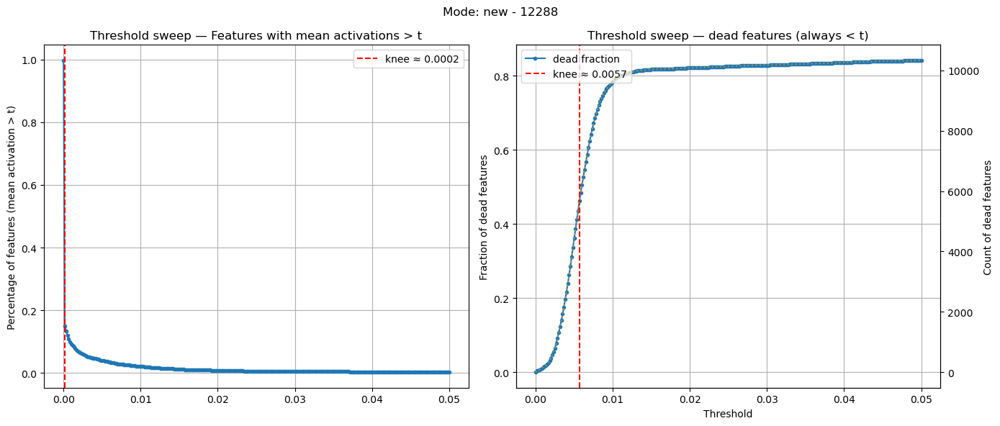

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.0056856186129152775


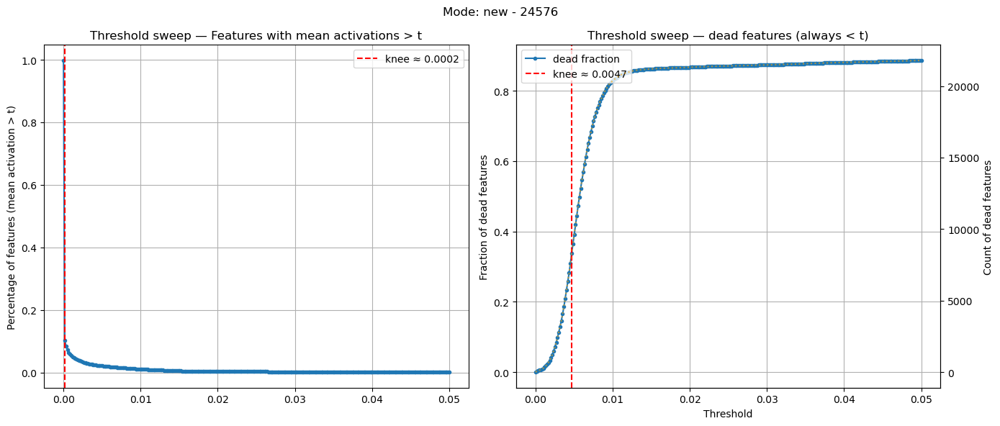

Knee (percent_live): 0.00016722407599445432
Knee (dead_fraction): 0.00468227406963706


In [8]:
# Threshold sweep per due metriche: (A) percentuale di feature con attivazione media > t
#                                  (B) percentuale/numero di dead-feature (sempre < t su tutti token+samples)
import numpy as np
import matplotlib.pyplot as plt
from math import ceil

# try Kneedle
try:
    from kneed import KneeLocator
    have_kneed = True
except Exception:
    have_kneed = False

def find_knee(thresholds, values, curve='convex', direction='decreasing'):
    # prova con KneeLocator se disponibile, altrimenti fallback con derivata discreta
    if have_kneed:
        try:
            kl = KneeLocator(thresholds, values, curve=curve, direction=direction)
            if kl.knee is not None:
                return kl.knee
        except Exception:
            pass
    # fallback: punto di massima variazione assoluta (prima derivata)
    diffs = np.abs(np.diff(values))
    if len(diffs) == 0:
        return None
    idx = int(np.argmax(diffs))
    # ritornare soglia corrispondente (usiamo il punto successivo per indicare la variazione)
    return float(thresholds[min(idx + 1, len(thresholds)-1)])

def threshold_sweep(feature_activations, n_thresholds=200, max_t=None):
    # feature_activations: torch.Tensor (n_samples, n_tokens, hidden_dim)

	# work on torch tensors and convert to numpy only for output/knee detection
	if isinstance(feature_activations, torch.Tensor):
		fa_t = feature_activations.detach().cpu()
	else:
		fa_t = torch.tensor(np.array(feature_activations), dtype=torch.float32)

	n_samples, n_tokens, hidden_dim = fa_t.shape

	# scegli massimo soglia ragionevole
	if max_t is None:
		mean_activations = fa_t.mean(dim=(0, 1))  # shape (hidden_dim,)
		max_t_val = float(mean_activations.max().item())
		if max_t_val <= 0:
			max_t_val = float(fa_t.max().item()) if fa_t.max().item() > 0 else 0.1
		max_t = max_t_val

	thresholds_t = torch.linspace(0.0, float(max_t), steps=n_thresholds, dtype=fa_t.dtype)

	# vectorized computations:
	mean_activations = fa_t.mean(dim=(0, 1))               # (hidden_dim,)
	# percent_live for each threshold: fraction of features with mean_activation > t
	# result shape: (n_thresholds,)
	percent_live_t = (mean_activations.unsqueeze(0) > thresholds_t.unsqueeze(1)).float().mean(dim=1)

	# dead features: a feature is dead at threshold t if its max across samples+tokens < t
	feature_max = fa_t.amax(dim=(0, 1))                    # (hidden_dim,)
	dead_mask = feature_max.unsqueeze(0) < thresholds_t.unsqueeze(1)  # (n_thresholds, hidden_dim)
	dead_fraction_t = dead_mask.float().mean(dim=1)        # (n_thresholds,)
	dead_count_t = dead_mask.sum(dim=1)                    # (n_thresholds,)

	# convert to numpy for plotting/knee detection/output
	thresholds = thresholds_t.cpu().numpy()
	percent_live = percent_live_t.cpu().numpy()
	dead_fraction = dead_fraction_t.cpu().numpy()
	dead_count = dead_count_t.cpu().numpy().astype(int)


	# trova knees (usiamo numpy arrays)
	knee_live = find_knee(thresholds, percent_live, curve='convex', direction='decreasing')
	knee_dead = find_knee(thresholds, dead_fraction, curve='concave', direction='increasing')

	return {
		'thresholds': thresholds,
		'percent_live': percent_live,
		'dead_fraction': dead_fraction,
		'dead_count': dead_count,
		'knee_live': knee_live,
		'knee_dead': knee_dead,
		'hidden_dim': int(hidden_dim)
	}

for mode in ["standard", "full", "new"]:
    print("-"*8, mode, "-"*8)
    for hidden_dim in hidden_dims:
        
        sae = SAE(input_dim, hidden_dim)
        sae.load_state_dict(torch.load(f"saved_models/sae_layer_{layer}_hiddim_{hidden_dim}_{mode}.pt"))

        encoder_weights = sae.encoder[0].weight
        decoder_weights = sae.decoder[0].weight
        feature_directions = get_feature_directions(decoder_weights)
        feature_activations = get_feature_activations(activations[layer], encoder_weights, sae.encoder[0].bias, decoder_weights)

    
        res = threshold_sweep(feature_activations, n_thresholds=300, max_t=0.05)
        
        # Plot a due pannelli
        fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharex=True)
        
        # Percentuale feature vive (basata su mean)
        axs[0].plot(res['thresholds'], res['percent_live'], '-o', markersize=3)
        axs[0].set_ylabel('Percentage of features (mean activation > t)')
        axs[0].set_title('Threshold sweep — Features with mean activations > t')
        axs[0].grid(True)
        if res['knee_live'] is not None:
            axs[0].axvline(res['knee_live'], color='red', linestyle='--', label=f'knee ≈ {res["knee_live"]:.4f}')
            axs[0].legend()
        
        # Dead features (fraction e count)
        axs[1].plot(res['thresholds'], res['dead_fraction'], '-o', markersize=3, label='dead fraction')
        axs2 = axs[1].twinx()
        axs2.plot(res['thresholds'], res['dead_count'], color='orange', alpha=0.6, label='dead count', linestyle=':')
        axs[1].set_xlabel('Threshold')
        axs[1].set_ylabel('Fraction of dead features')
        axs2.set_ylabel('Count of dead features')
        axs[1].set_title('Threshold sweep — dead features (always < t)')
        axs[1].grid(True)
        if res['knee_dead'] is not None:
            axs[1].axvline(res['knee_dead'], color='red', linestyle='--', label=f'knee ≈ {res["knee_dead"]:.4f}')
            axs[1].legend(loc='upper left')
        
        # migliorie estetiche
        
        plt.suptitle(f"Mode: {mode} - {hidden_dim}", y=0.98)
        plt.tight_layout()
        plt.show()
        
        print("Knee (percent_live):", res['knee_live'])
        print("Knee (dead_fraction):", res['knee_dead'])

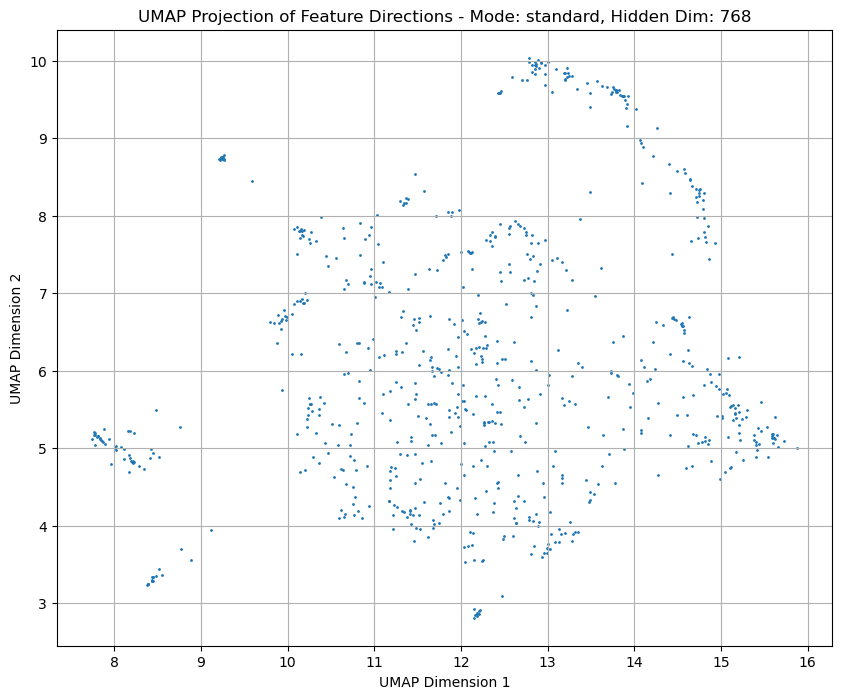

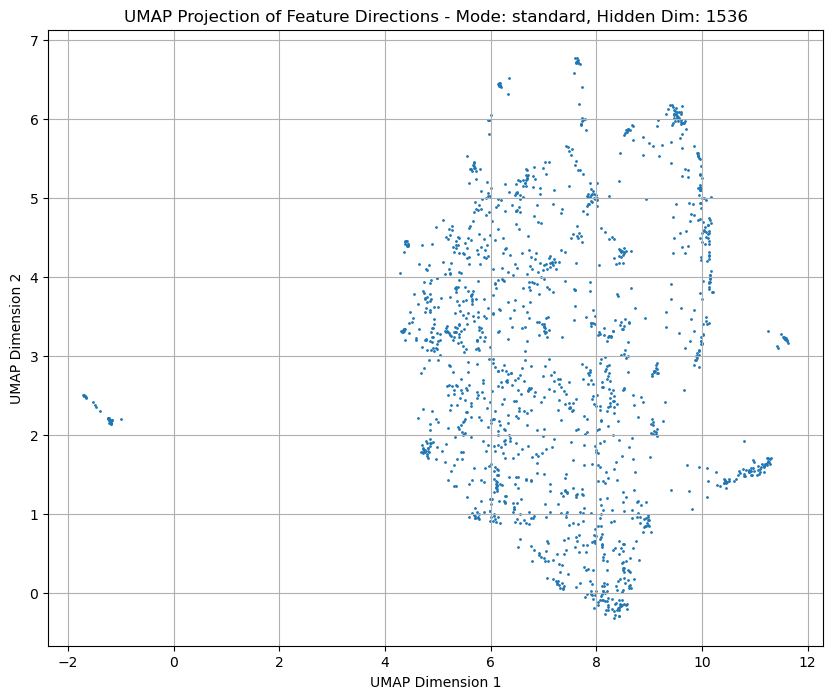

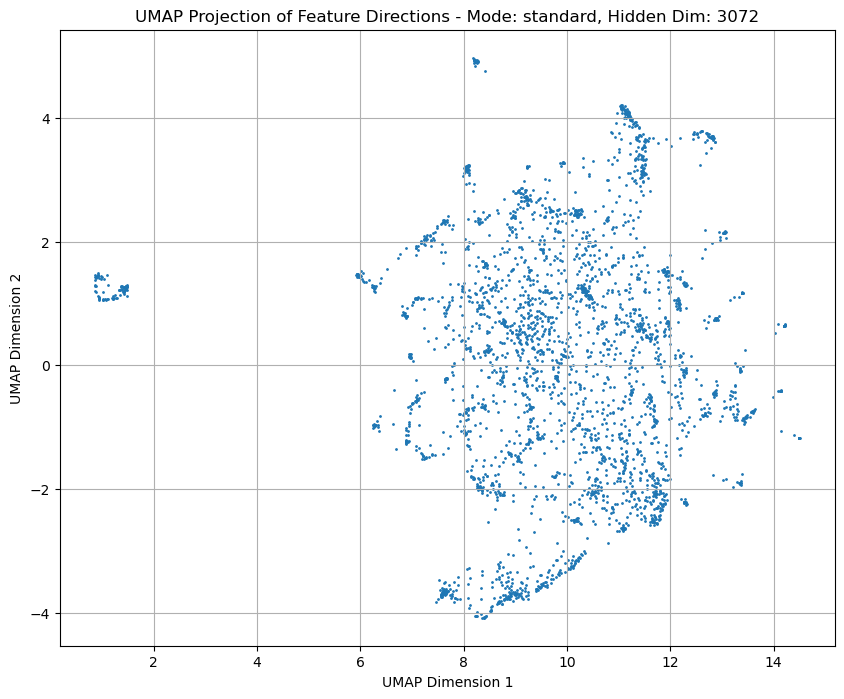

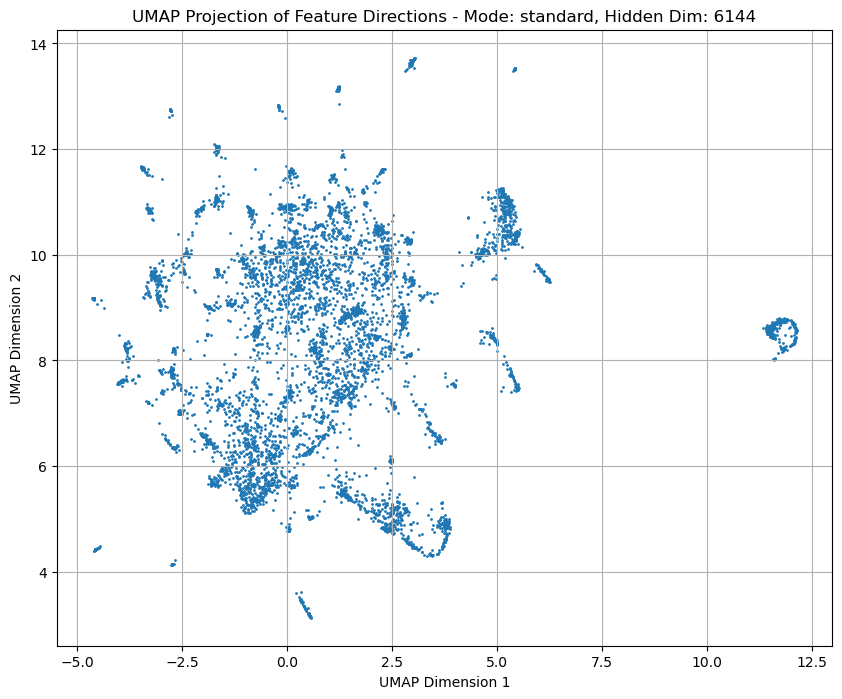

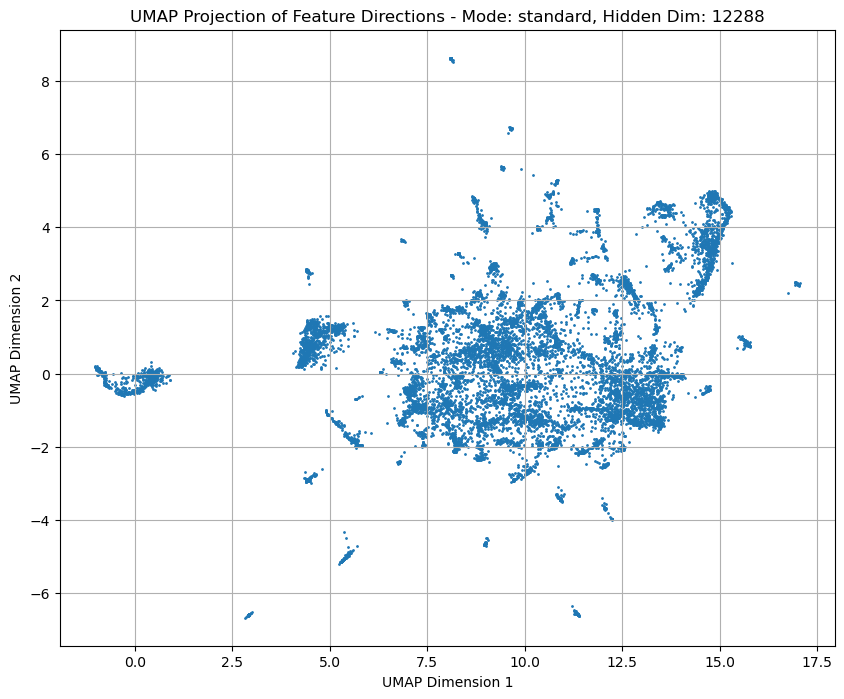

...

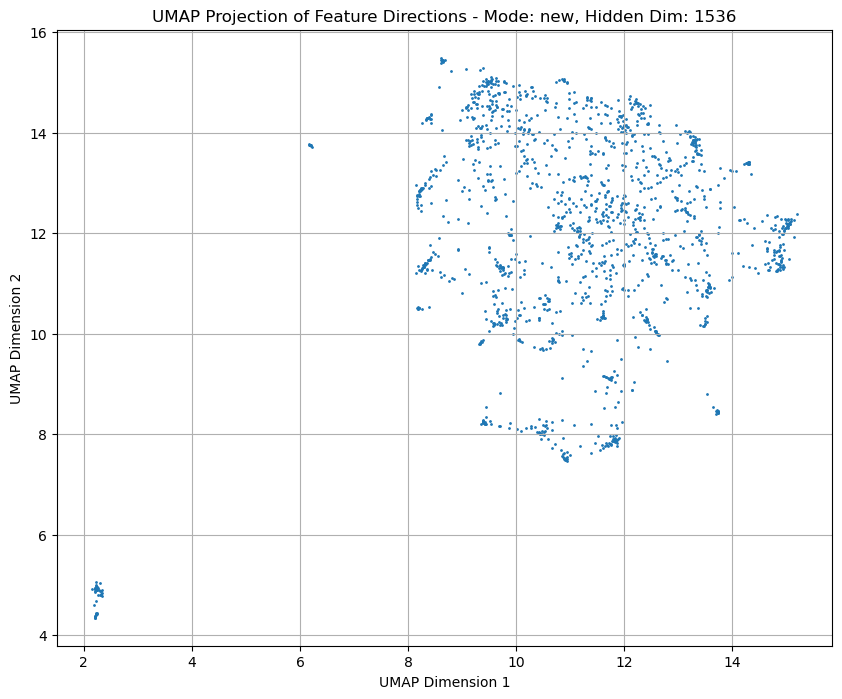

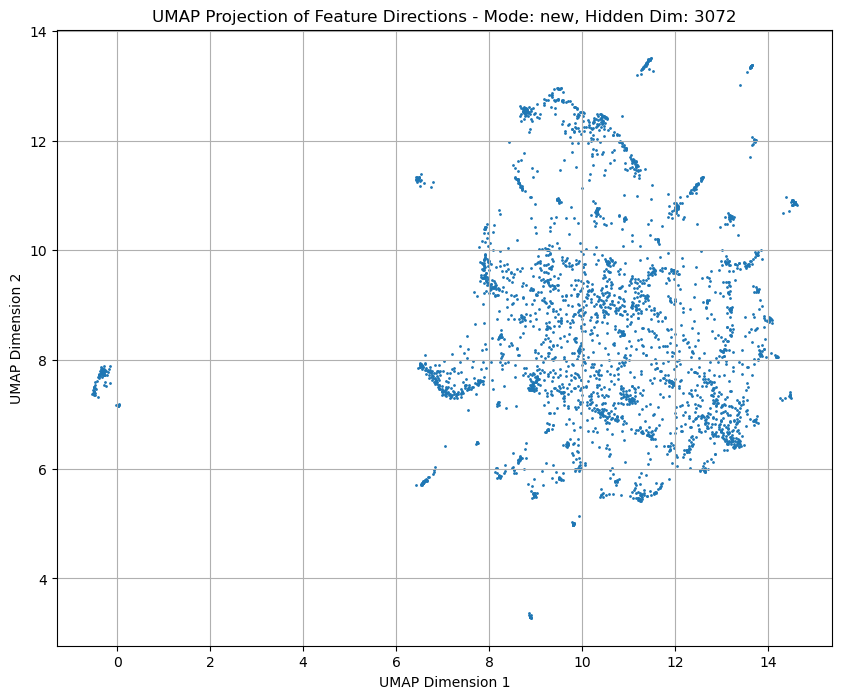

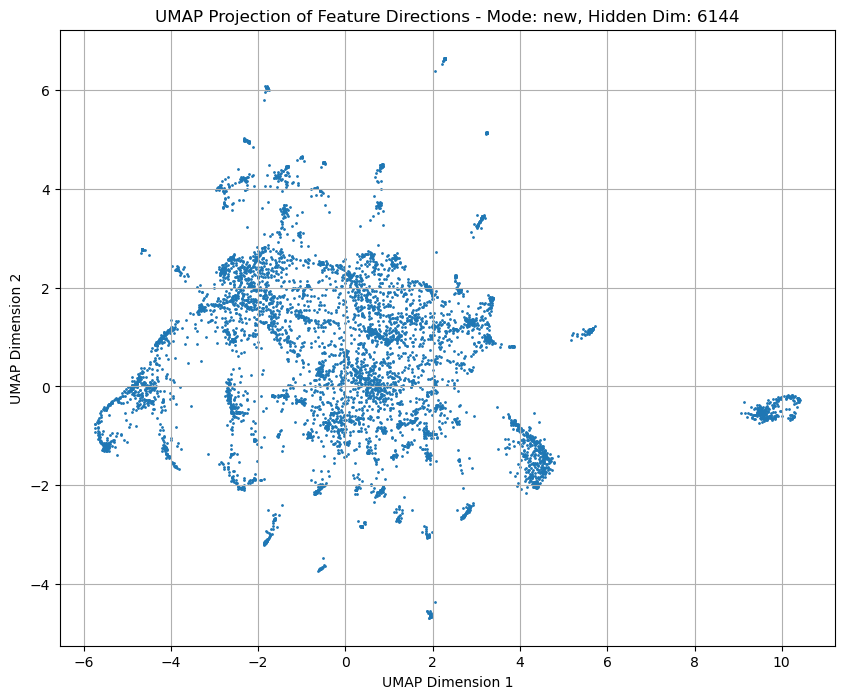

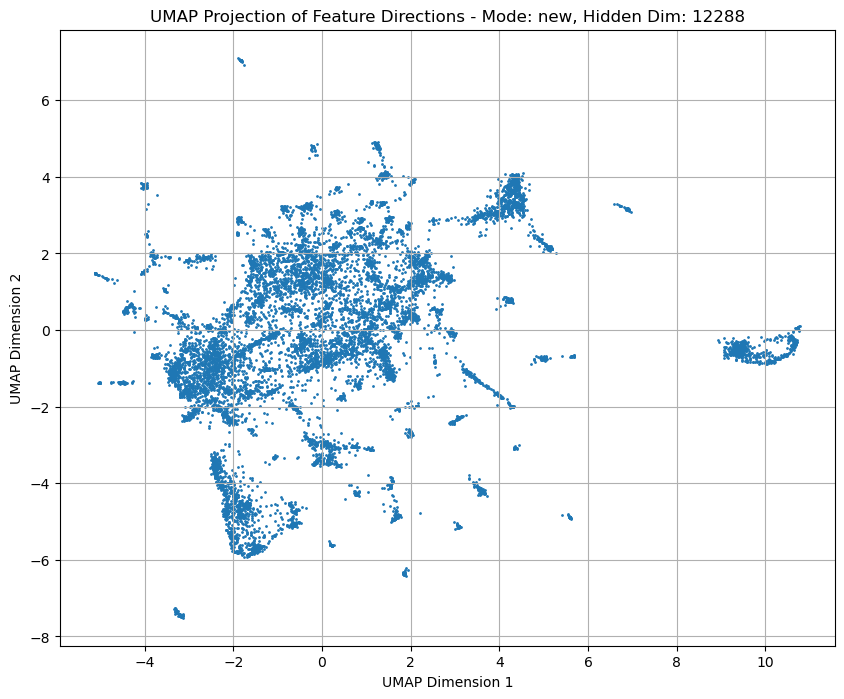

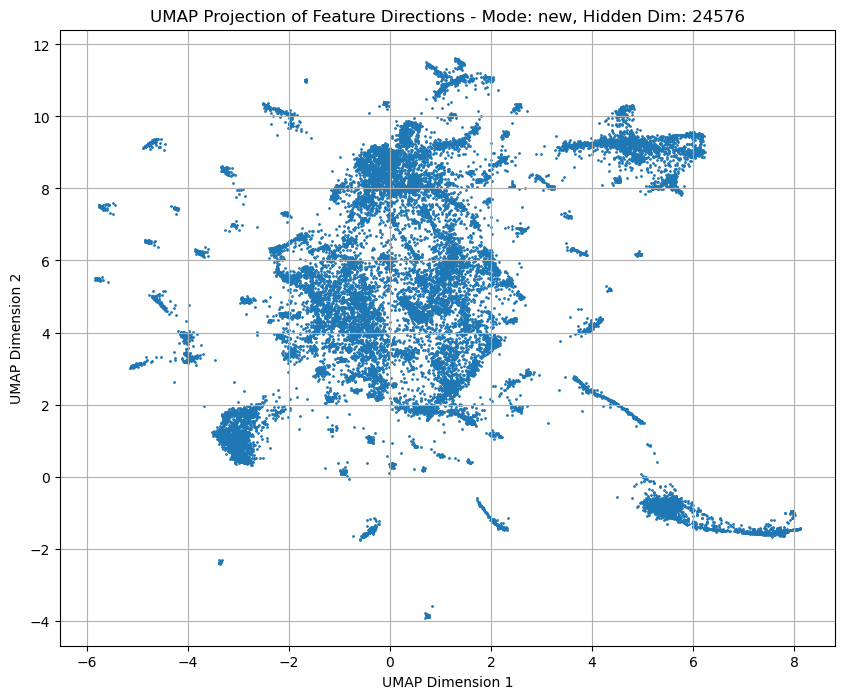

In [9]:
# UMAP and HDBSCAN clustering of feature directions
from umap import UMAP
from matplotlib import pyplot as plt

for mode in ["standard", "full", "new"]:
    
	for hidden_dim in hidden_dims:
        
		sae = SAE(input_dim, hidden_dim)
		sae.load_state_dict(torch.load(f"saved_models/sae_layer_{layer}_hiddim_{hidden_dim}_{mode}.pt"))

		decoder_weights = sae.decoder[0].weight
		feature_directions = get_feature_directions(decoder_weights)
		
		fd_np = feature_directions.detach().cpu().numpy().T
		# print(f"Feature directions shape: {fd_np.shape}")
		reducer = umap.UMAP(n_components=2, n_neighbors=15, metric="cosine", min_dist=0.05)
		embedding = reducer.fit_transform(fd_np)
		n_points = embedding.shape[0]
		# print(f"Numero di punti generati: {n_points}")

		plt.figure(figsize=(10, 8))
		plt.scatter(embedding[:, 0], embedding[:, 1], s=1, alpha=1)
		plt.title(f"UMAP Projection of Feature Directions - Mode: {mode}, Hidden Dim: {hidden_dim}")
		plt.xlabel("UMAP Dimension 1")
		plt.ylabel("UMAP Dimension 2")
		plt.grid(True)
		plt.show()


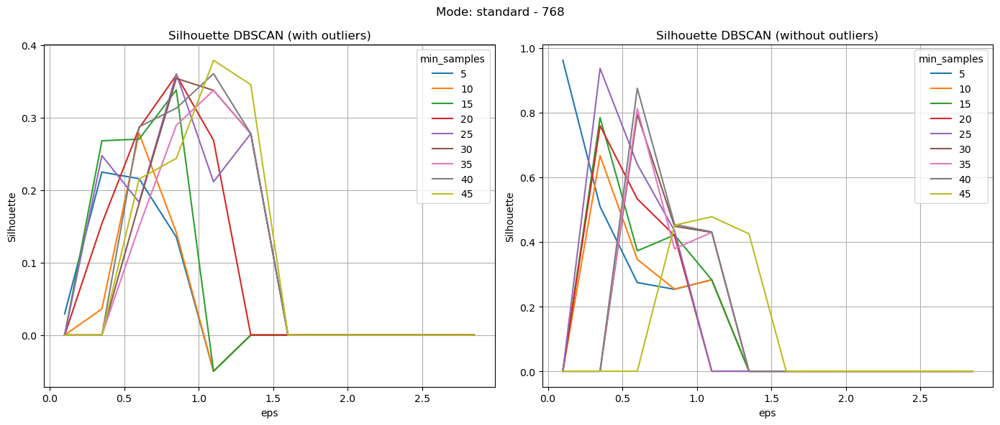

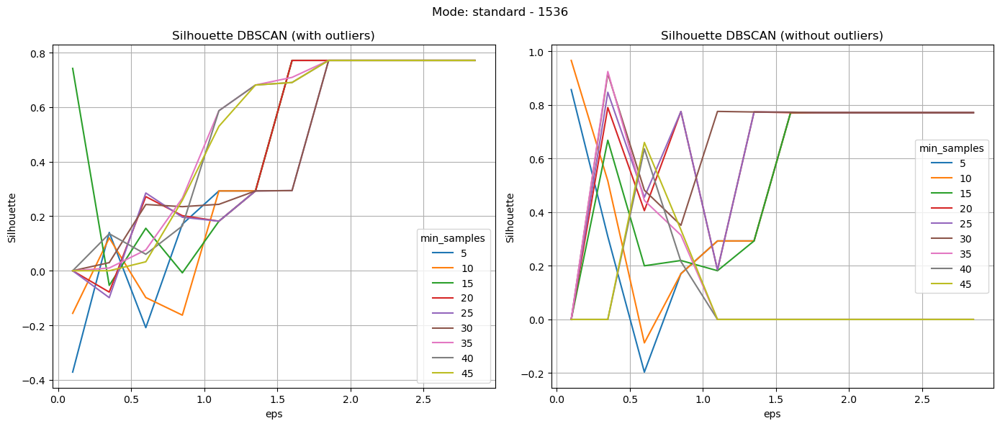

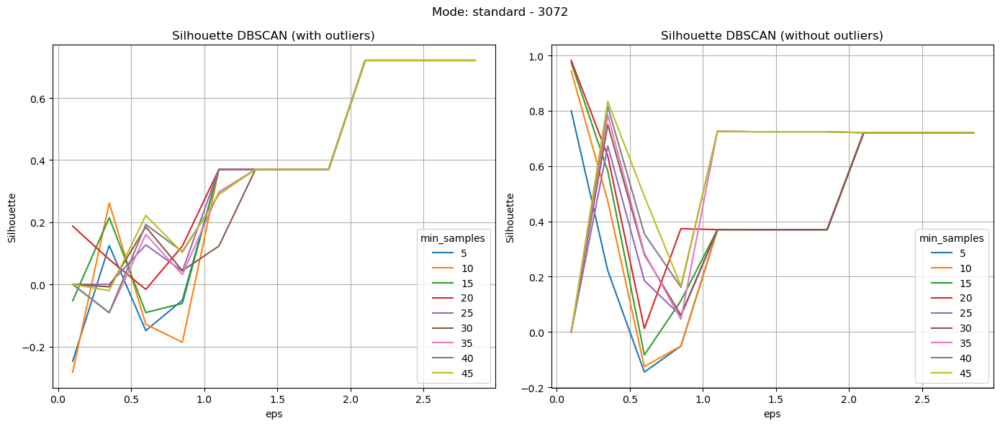

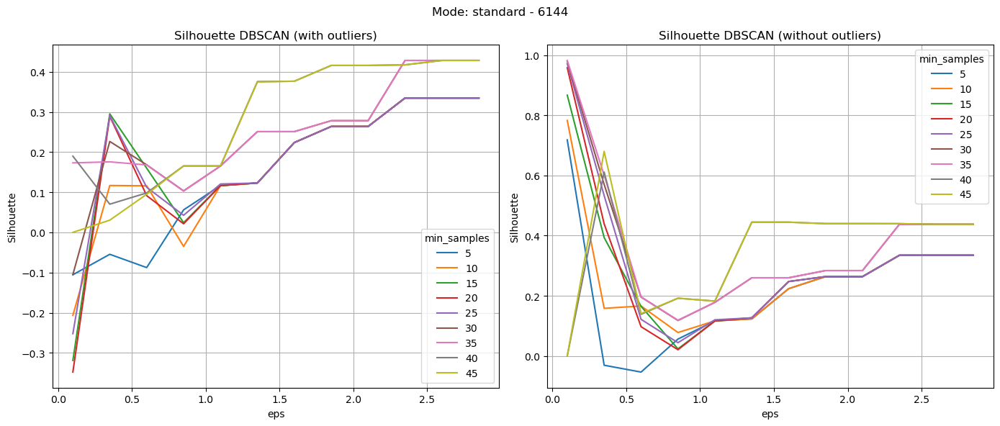

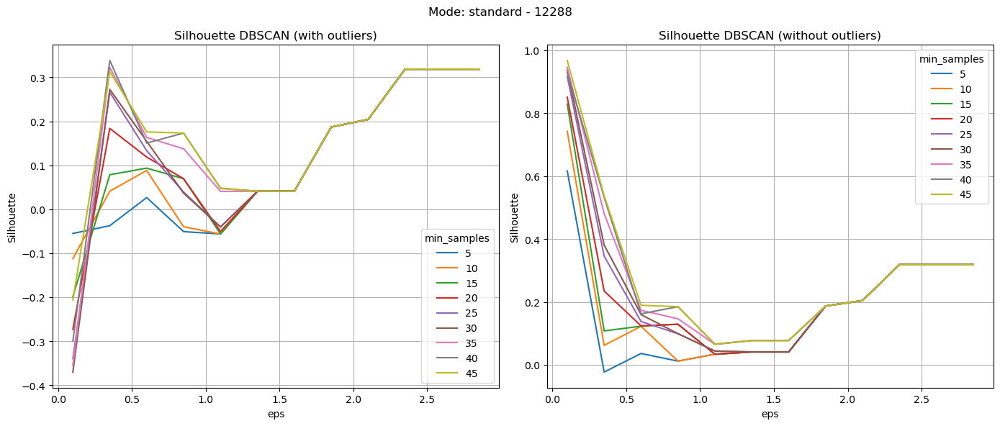

...

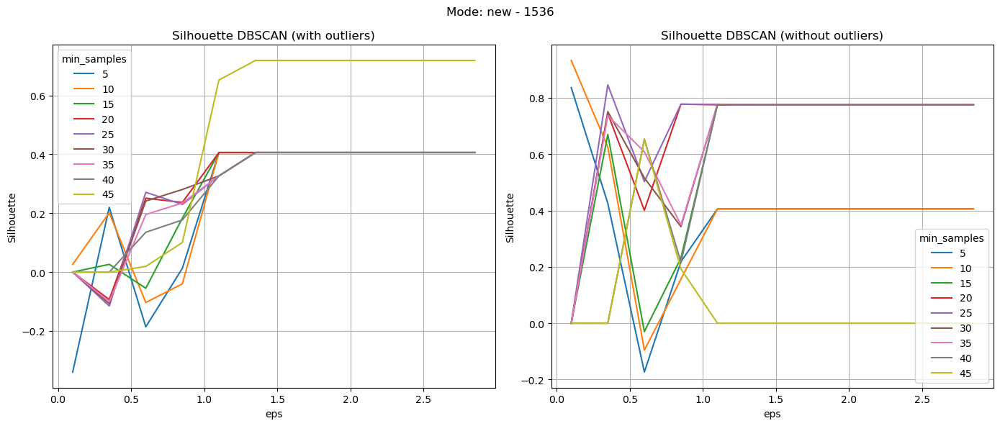

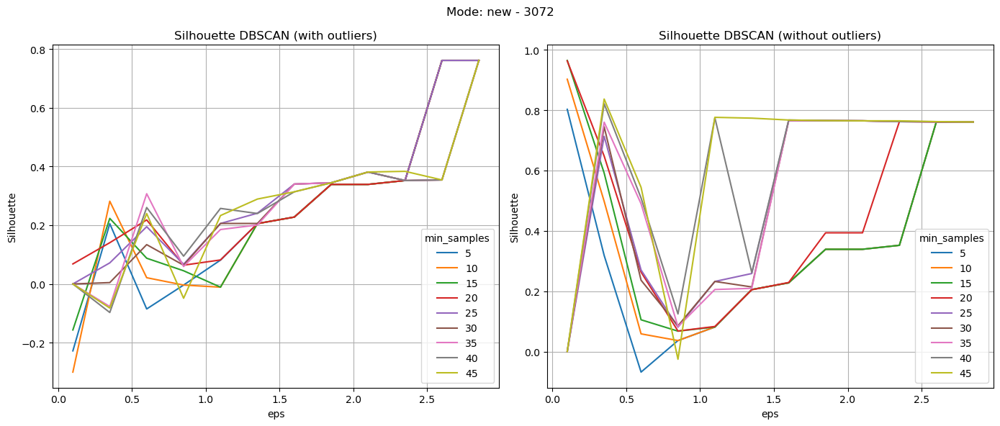

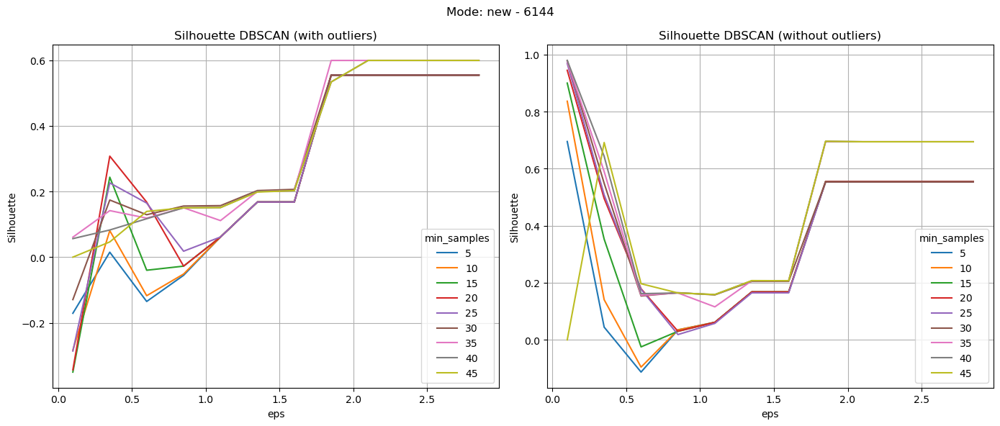

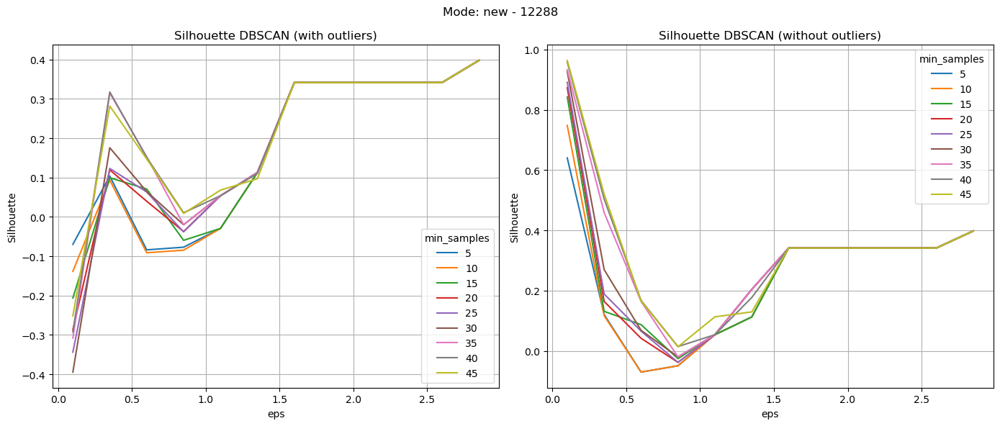

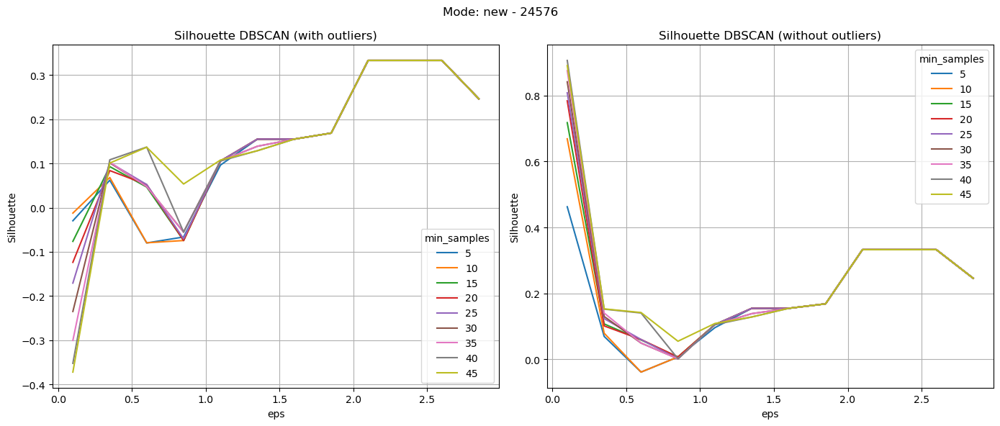

In [10]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

features_per_cluster = {}

for mode in ["standard", "full", "new"]:

	features_per_cluster[mode] = {}

	for hidden_dim in hidden_dims:
     	
		features_per_cluster[mode][hidden_dim] = []
        
		sae = SAE(input_dim, hidden_dim)
		sae.load_state_dict(torch.load(f"saved_models/sae_layer_{layer}_hiddim_{hidden_dim}_{mode}.pt"))

		decoder_weights = sae.decoder[0].weight
		feature_directions = get_feature_directions(decoder_weights)
		fd_np = feature_directions.detach().cpu().numpy().T

		reducer = umap.UMAP(n_components=10, n_neighbors=15, metric="cosine", min_dist=0.1)
		embedding = reducer.fit_transform(fd_np)

		dbscan_nsamples_sizes = list(range(5,50,5))
		dbscan_eps_sizes = np.arange(0.1, 3, 0.25)

		fig, axs = plt.subplots(1,2, figsize=(14,6))
		for s in dbscan_nsamples_sizes:
			dbscan_silhouettes = []
			dbscan_silhouettes_cleaned = []
			for e in dbscan_eps_sizes:
				dbscan = DBSCAN(eps=e, min_samples=s)
				dbscan.fit(embedding)
				
				dbscan_silhouettes.append(silhouette_score(embedding, dbscan.labels_) if len(set(dbscan.labels_)) > 1 else 0)
				dbscan_silhouettes_cleaned.append(silhouette_score(embedding[dbscan.labels_ != -1], dbscan.labels_[dbscan.labels_ != -1]) if len(set(dbscan.labels_[dbscan.labels_ != -1])) > 1 else 0 )
				
			axs[0].plot(dbscan_eps_sizes, dbscan_silhouettes, label=f'{s}')
			axs[1].plot(dbscan_eps_sizes, dbscan_silhouettes_cleaned, label=f'{s}')

		axs[0].set_title('Silhouette DBSCAN (with outliers)')
		axs[0].set_xlabel('eps')
		axs[0].set_ylabel('Silhouette')
		axs[0].legend(title='min_samples')
		axs[0].grid()
		axs[1].set_title('Silhouette DBSCAN (without outliers)')
		axs[1].set_xlabel('eps')
		axs[1].set_ylabel('Silhouette')
		axs[1].legend(title='min_samples')
		axs[1].grid()
		plt.suptitle(f"Mode: {mode} - {hidden_dim}", y=0.98)
		plt.tight_layout()
		plt.show()

Cluster 1: 65 elements
Cluster 2: 21 elements
Cluster 3: 53 elements
Cluster 4: 41 elements
Cluster 5: 19 elements
Cluster 6: 17 elements
Cluster 7: 19 elements
Cluster 8: 15 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (9), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


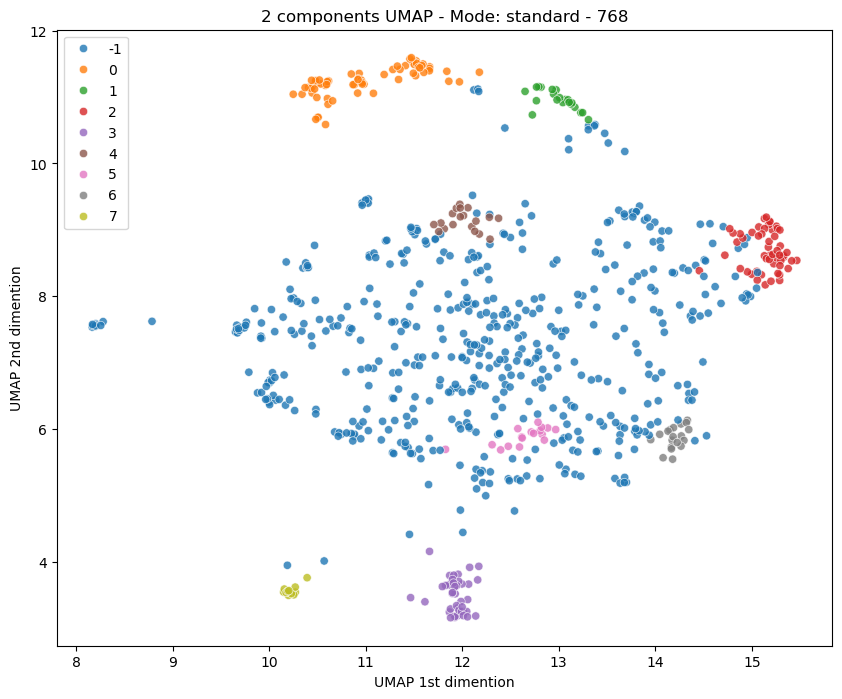

Cluster 1: 1448 elements
Cluster 2: 30 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


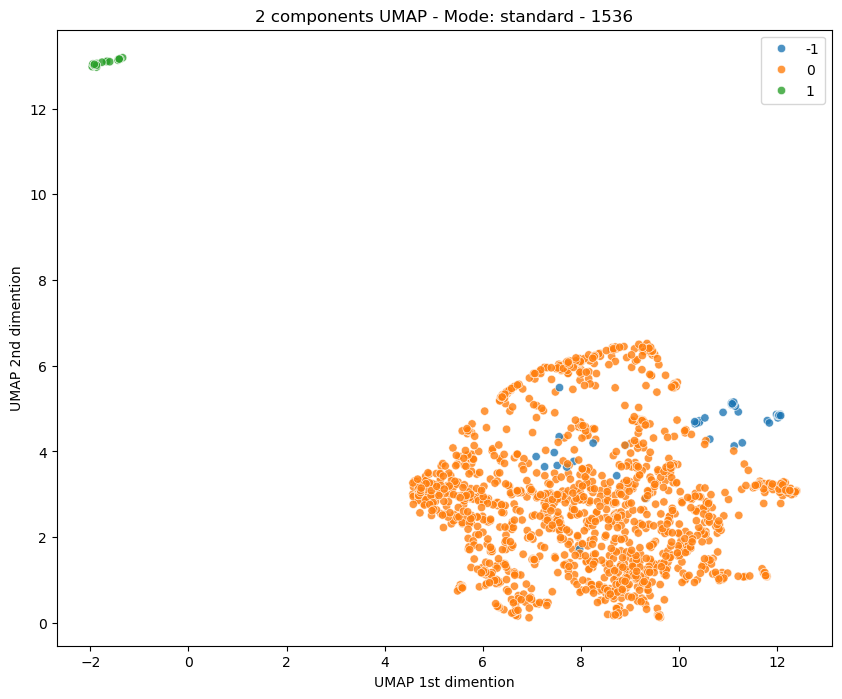

Cluster 1: 2962 elements
Cluster 2: 32 elements
Cluster 3: 78 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


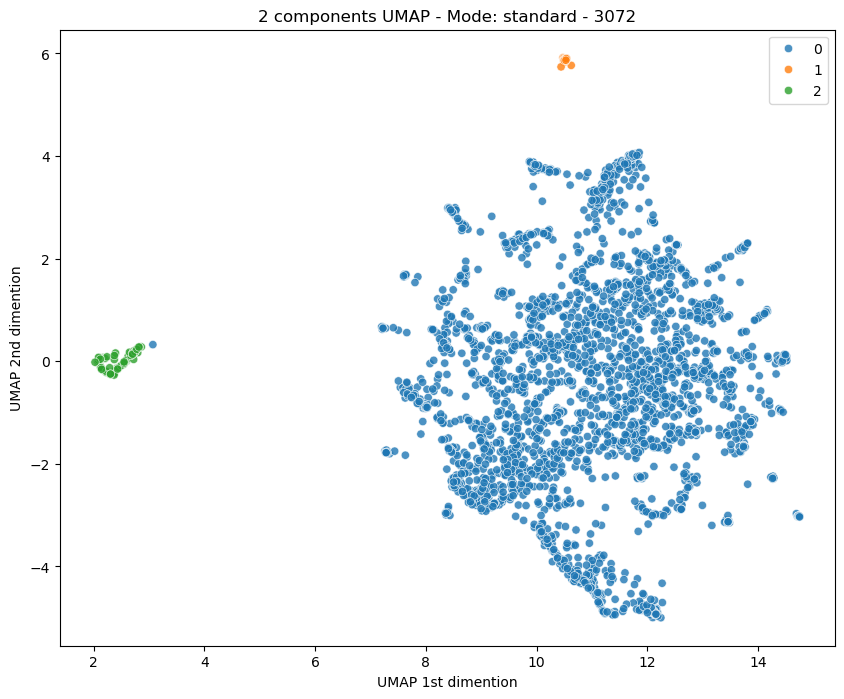

Cluster 1: 5767 elements
Cluster 2: 217 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


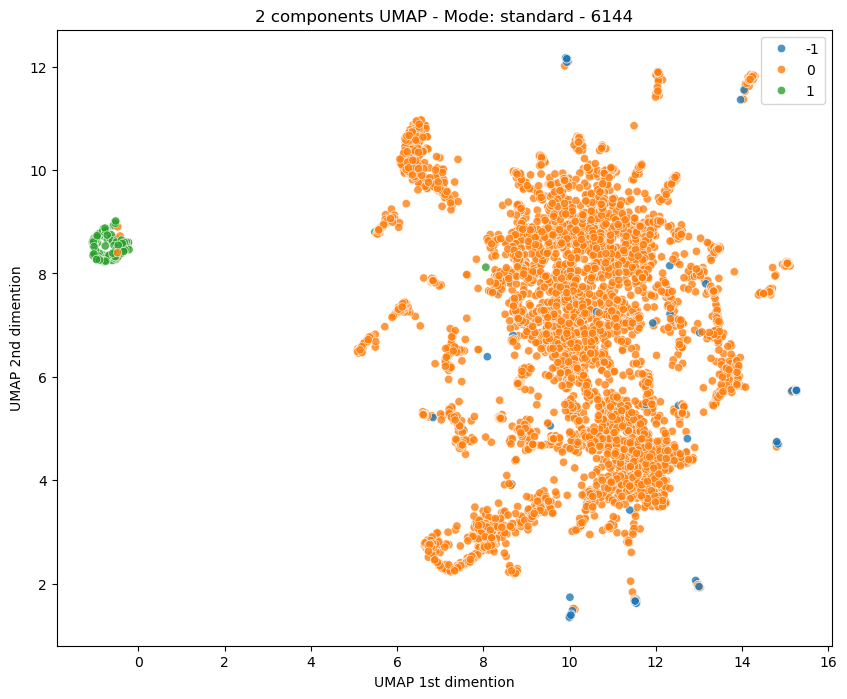

Cluster 1: 11047 elements
Cluster 2: 46 elements
Cluster 3: 578 elements
Cluster 4: 59 elements
Cluster 5: 225 elements
Cluster 6: 92 elements
Cluster 7: 60 elements
Cluster 8: 57 elements
Cluster 9: 44 elements
Cluster 10: 45 elements
Cluster 11: 35 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (11), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


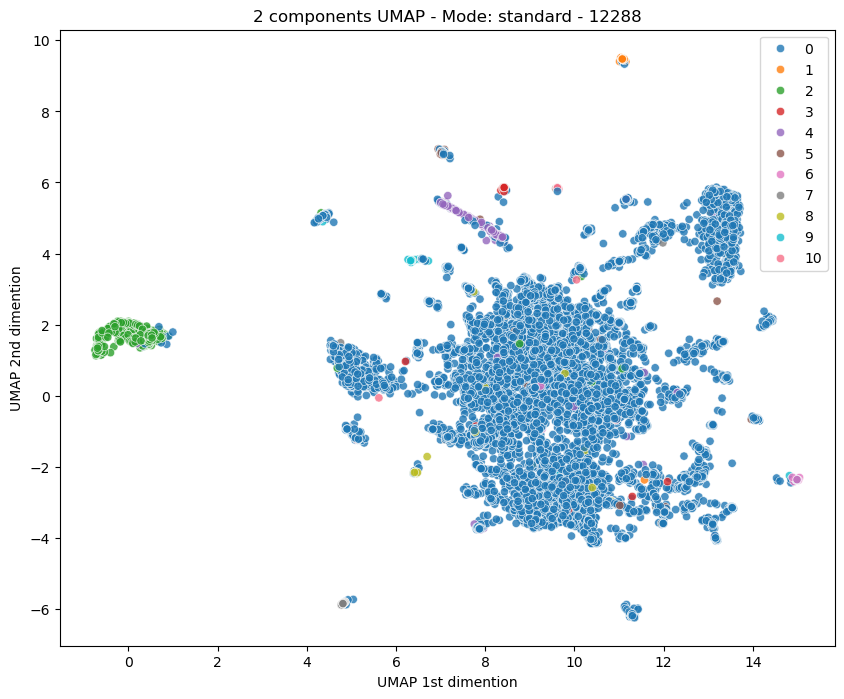

Cluster 1: 21810 elements
Cluster 2: 1490 elements
Cluster 3: 157 elements
Cluster 4: 131 elements
Cluster 5: 52 elements
Cluster 6: 135 elements
Cluster 7: 37 elements
Cluster 8: 290 elements
Cluster 9: 182 elements
Cluster 10: 107 elements
Cluster 11: 133 elements
Cluster 12: 52 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (12), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


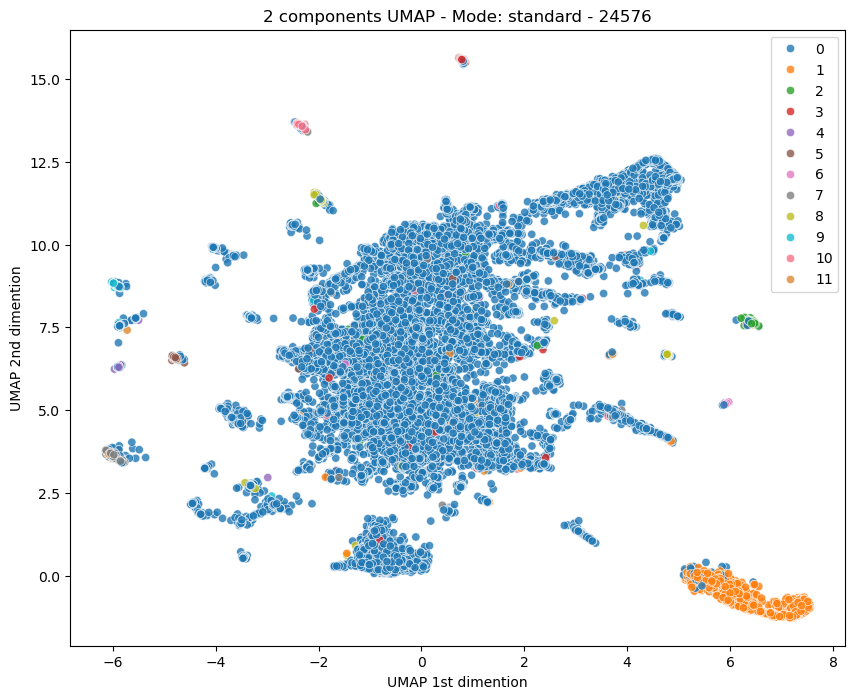

Cluster 1: 60 elements
Cluster 2: 45 elements
Cluster 3: 49 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (4), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


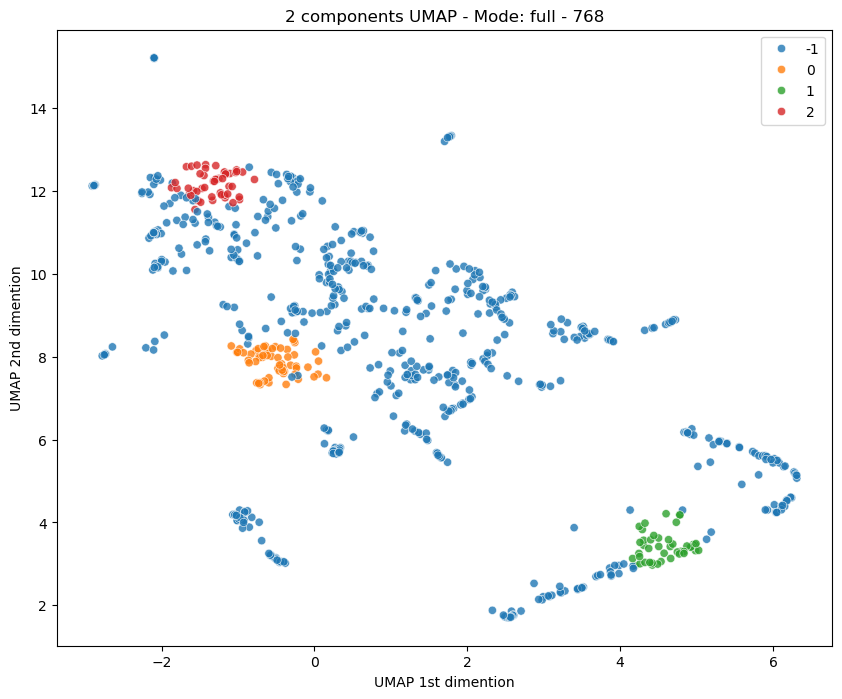

Cluster 1: 963 elements
Cluster 2: 543 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


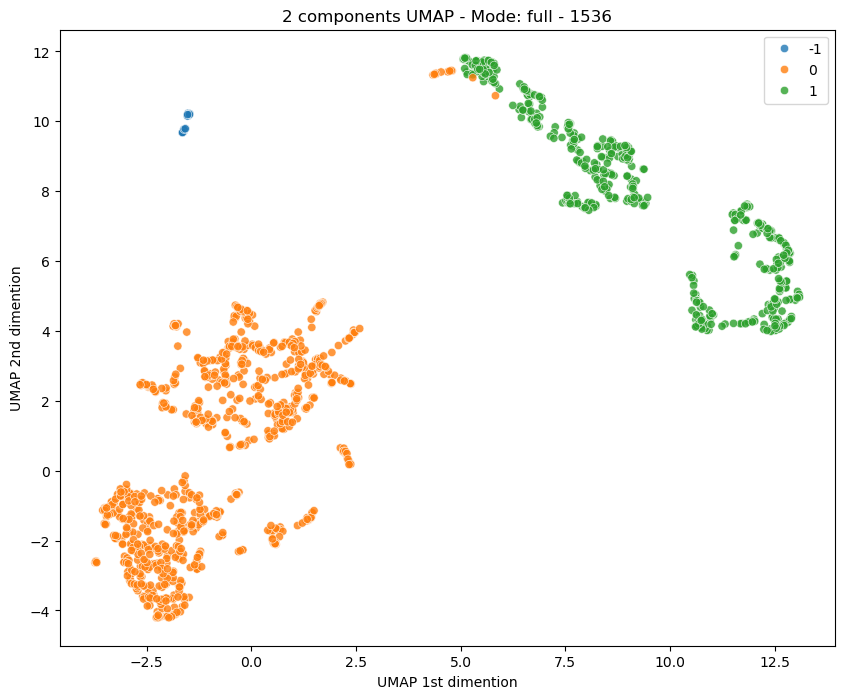

Cluster 1: 1839 elements
Cluster 2: 1233 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (2), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


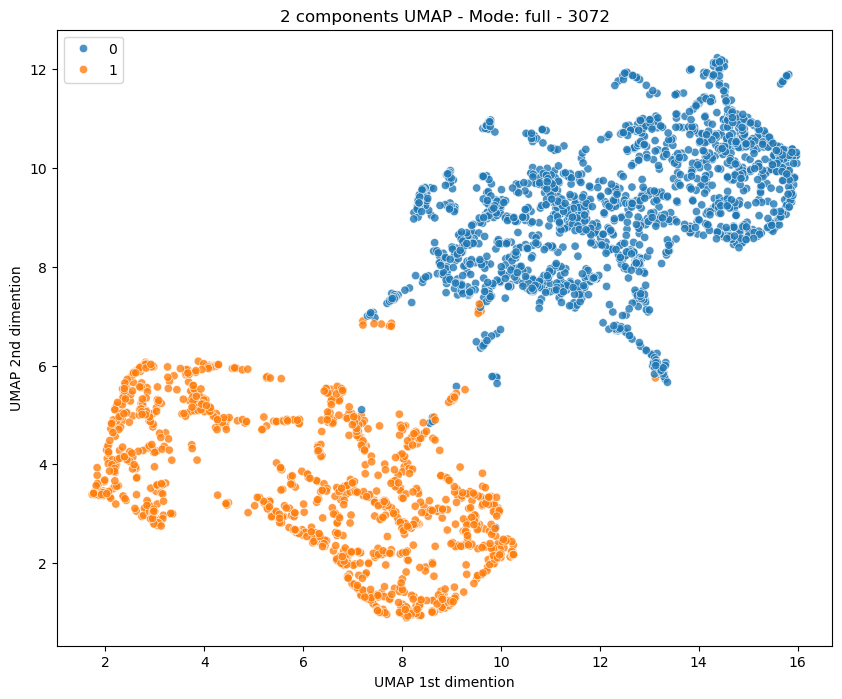

Cluster 1: 65 elements
Cluster 2: 138 elements
Cluster 3: 124 elements
Cluster 4: 64 elements
Cluster 5: 54 elements
Cluster 6: 42 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (7), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


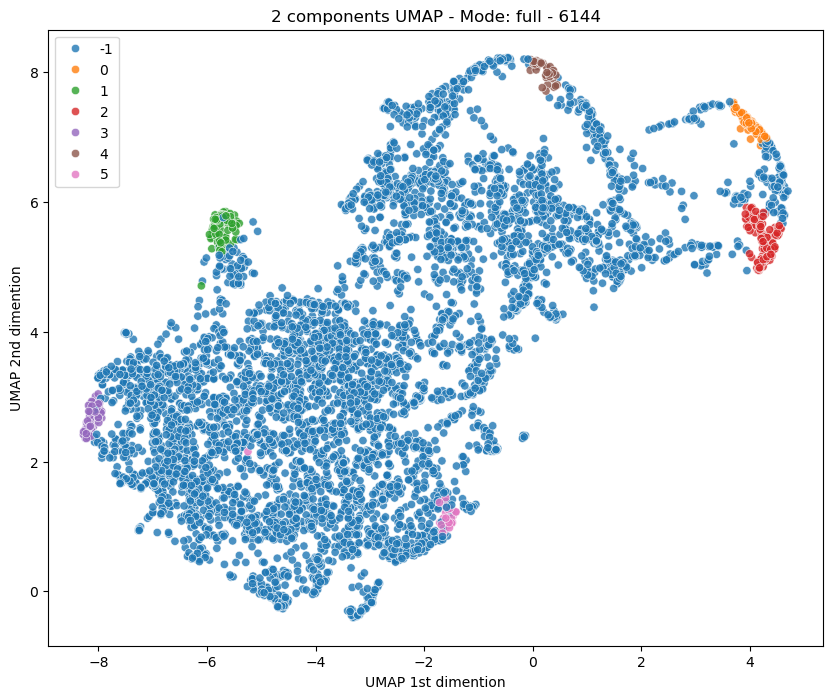

Cluster 1: 29 elements
Cluster 2: 75 elements
Cluster 3: 20 elements
Cluster 4: 21 elements
Cluster 5: 20 elements
Cluster 6: 20 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (7), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


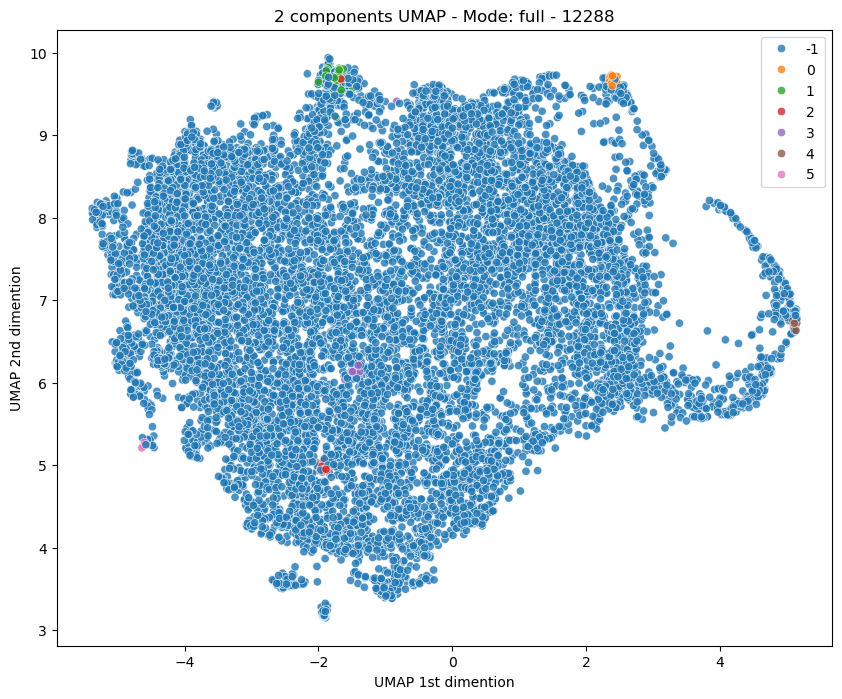

Cluster 1: 32 elements
Cluster 2: 34 elements
Cluster 3: 24 elements
Cluster 4: 51 elements
Cluster 5: 29 elements
Cluster 6: 26 elements
Cluster 7: 66 elements
Cluster 8: 25 elements
Cluster 9: 29 elements
Cluster 10: 35 elements
Cluster 11: 27 elements
Cluster 12: 27 elements
Cluster 13: 28 elements
Cluster 14: 23 elements
Cluster 15: 28 elements
Cluster 16: 36 elements
Cluster 17: 32 elements
Cluster 18: 43 elements
Cluster 19: 28 elements
Cluster 20: 21 elements
Cluster 21: 27 elements
Cluster 22: 26 elements
Cluster 23: 20 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: 
The palette list has fewer values (20) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


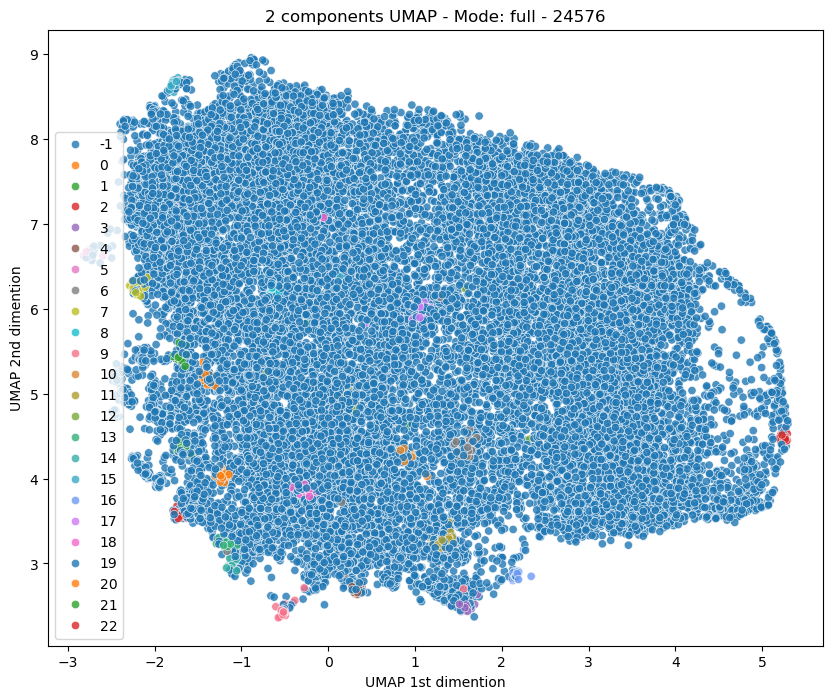

Cluster 1: 755 elements
Cluster 2: 13 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (2), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


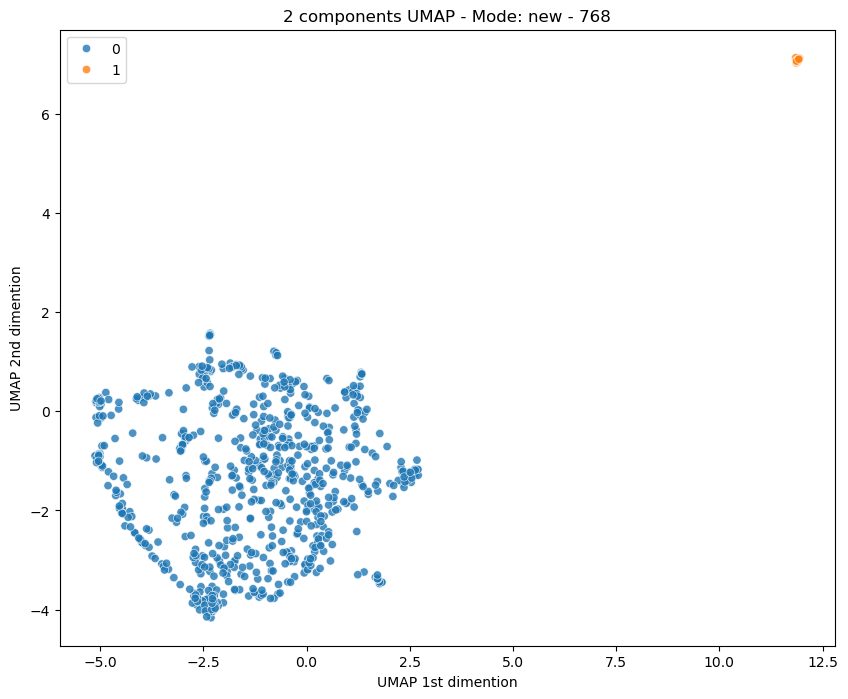

Cluster 1: 1464 elements
Cluster 2: 41 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


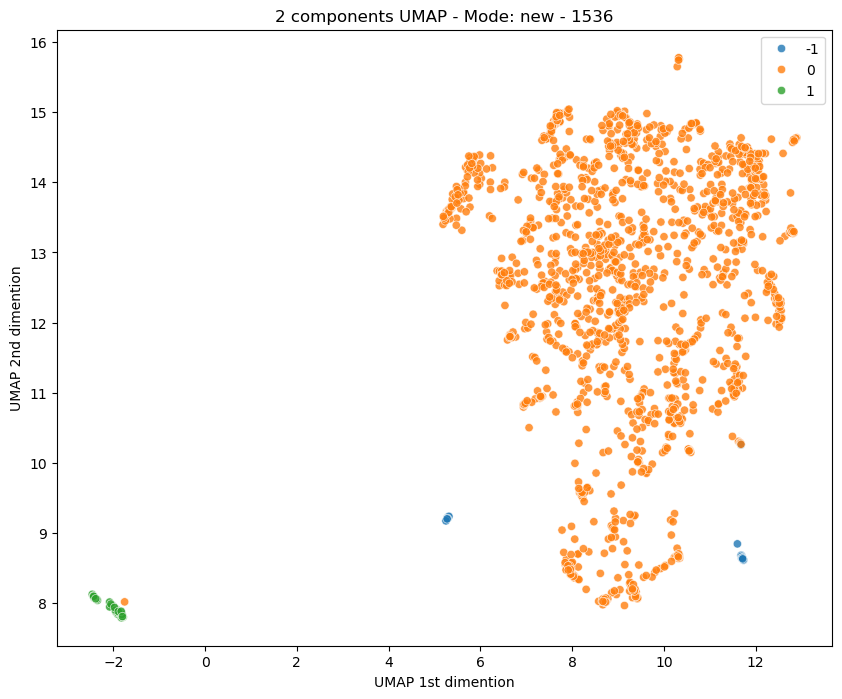

Cluster 1: 83 elements
Cluster 2: 2790 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


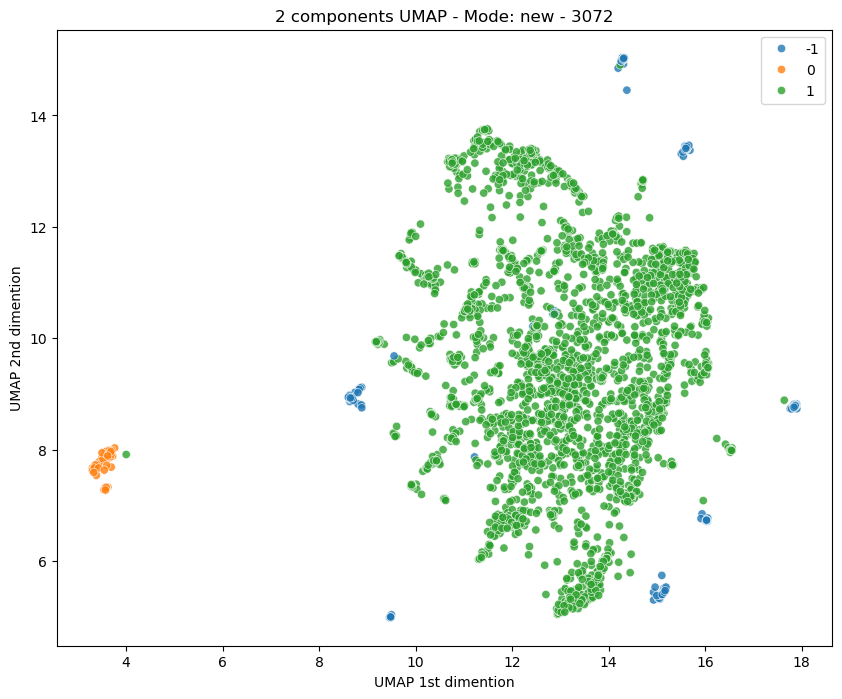

Cluster 1: 377 elements
Cluster 2: 241 elements
Cluster 3: 61 elements
Cluster 4: 365 elements
Cluster 5: 69 elements
Cluster 6: 129 elements
Cluster 7: 368 elements
Cluster 8: 160 elements
Cluster 9: 439 elements
Cluster 10: 141 elements
Cluster 11: 62 elements
Cluster 12: 62 elements
Cluster 13: 107 elements
Cluster 14: 72 elements
Cluster 15: 60 elements
Cluster 16: 56 elements
Cluster 17: 51 elements
Cluster 18: 195 elements
Cluster 19: 46 elements
Cluster 20: 209 elements
Cluster 21: 58 elements
Cluster 22: 53 elements
Cluster 23: 173 elements
Cluster 24: 46 elements
Cluster 25: 62 elements
Cluster 26: 57 elements
Cluster 27: 53 elements
Cluster 28: 48 elements
Cluster 29: 49 elements
Cluster 30: 61 elements
Cluster 31: 54 elements
Cluster 32: 38 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: 
The palette list has fewer values (20) than needed (33) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


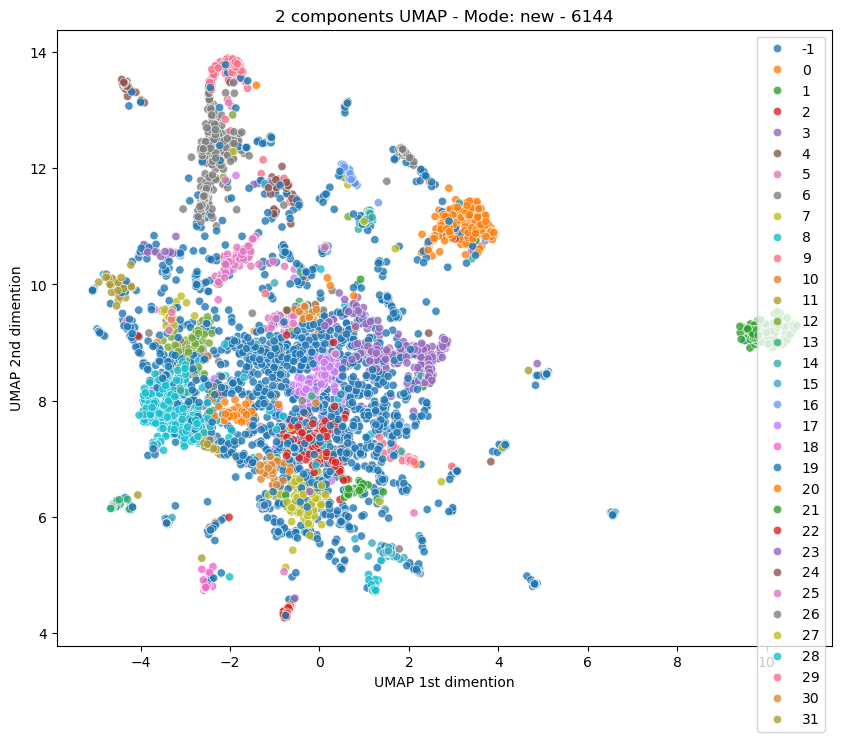

Cluster 1: 570 elements
Cluster 2: 589 elements
Cluster 3: 323 elements
Cluster 4: 66 elements
Cluster 5: 138 elements
Cluster 6: 716 elements
Cluster 7: 50 elements
Cluster 8: 918 elements
Cluster 9: 51 elements
Cluster 10: 96 elements
Cluster 11: 976 elements
Cluster 12: 148 elements
Cluster 13: 146 elements
Cluster 14: 129 elements
Cluster 15: 50 elements
Cluster 16: 68 elements
Cluster 17: 52 elements
Cluster 18: 145 elements
Cluster 19: 103 elements
Cluster 20: 238 elements
Cluster 21: 85 elements
Cluster 22: 92 elements
Cluster 23: 180 elements
Cluster 24: 49 elements
Cluster 25: 291 elements
Cluster 26: 47 elements
Cluster 27: 106 elements
Cluster 28: 122 elements
Cluster 29: 275 elements
Cluster 30: 38 elements
Cluster 31: 41 elements
Cluster 32: 57 elements
Cluster 33: 59 elements
Cluster 34: 60 elements
Cluster 35: 94 elements
Cluster 36: 68 elements
Cluster 37: 54 elements
Cluster 38: 83 elements
Cluster 39: 91 elements
Cluster 40: 92 elements
Cluster 41: 24 elements
Cluster

/tmp/ipykernel_7859/1163934931.py:56: UserWarning: 
The palette list has fewer values (20) than needed (68) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


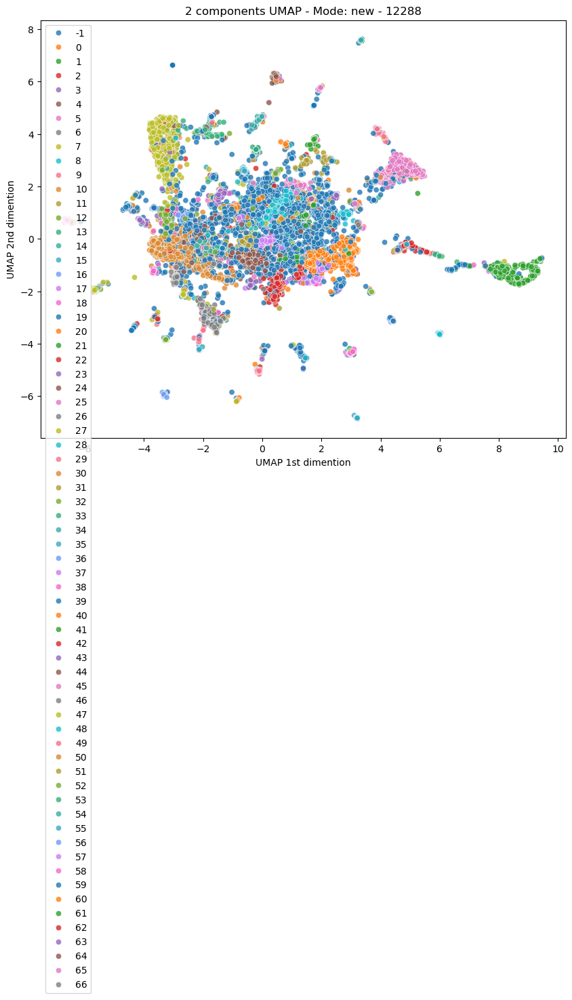

Cluster 1: 109 elements
Cluster 2: 20824 elements
Cluster 3: 1526 elements
Cluster 4: 413 elements
Cluster 5: 139 elements
Cluster 6: 307 elements
Cluster 7: 141 elements
Cluster 8: 530 elements
Cluster 9: 199 elements
Cluster 10: 82 elements
Cluster 11: 70 elements
Cluster 12: 51 elements
Cluster 13: 91 elements
Cluster 14: 93 elements


/tmp/ipykernel_7859/1163934931.py:56: UserWarning: The palette list has more values (20) than needed (15), which may not be intended.
  sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))


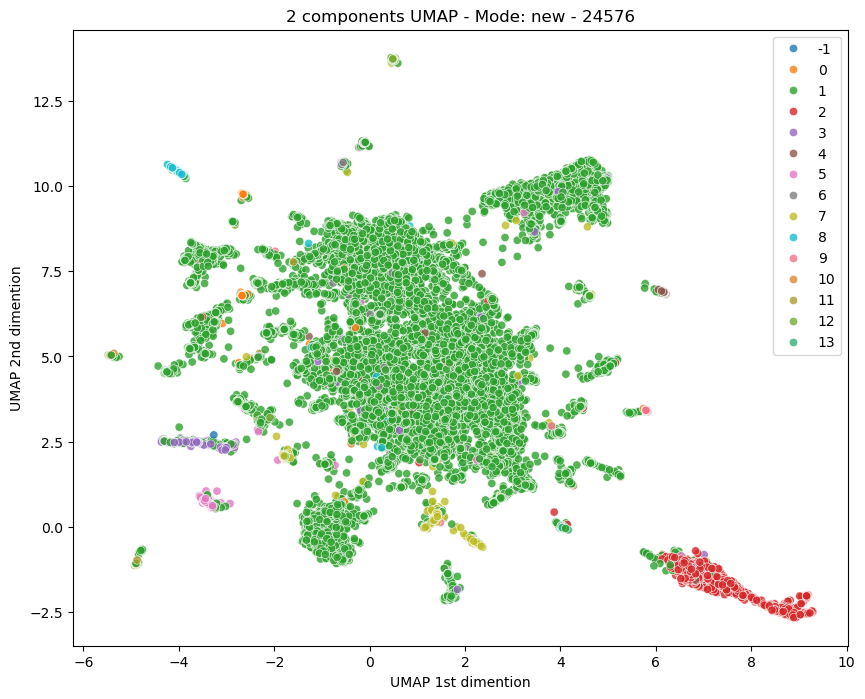

In [34]:
db_values = {"standard": {
    768: [0.4, 15],
    1536:[0.8, 20],
    3072:[1.5, 10],
    6144: [1.5, 45],
    12288: [1.5, 10],
    24576:[1.5, 10]
},
            "full": {
    768: [0.6, 40],
    1536:[1.7, 45],
    3072:[1.2, 30],
    6144: [0.3, 40],
    12288: [0.1, 20],
    24576:[0.1, 20]
            },
            "new":{
    768: [1.6, 10],
    1536:[1.0, 25],
    3072:[1.3, 45],
    6144: [0.4, 45],
    12288: [0.3, 35],
    24576:[1.2, 40]
            }}
for mode in ["standard", "full", "new"]:

	features_per_cluster[mode] = {}

	for hidden_dim in hidden_dims:
		sae = SAE(input_dim, hidden_dim)
		sae.load_state_dict(torch.load(f"saved_models/sae_layer_{layer}_hiddim_{hidden_dim}_{mode}.pt"))

		decoder_weights = sae.decoder[0].weight
		feature_directions = get_feature_directions(decoder_weights)
		fd_np = feature_directions.detach().cpu().numpy().T

		reducer = umap.UMAP(n_components=10, n_neighbors=15, metric="cosine", min_dist=0.1)
		embedding = reducer.fit_transform(fd_np)

		dbscan = DBSCAN(eps=db_values[mode][hidden_dim][0], min_samples=db_values[mode][hidden_dim][1])
		dbscan.fit(embedding)
		features_per_cluster[mode][hidden_dim] = defaultdict(list)
		labels = dbscan.labels_           # array-like, shape (N,)
		for idx, lab in enumerate(labels):
			features_per_cluster[mode][hidden_dim][int(lab)].append(int(idx))

		cluster_sizes = np.bincount(dbscan.labels_[dbscan.labels_ != -1])
		print("\n".join(["Cluster %d: %d elements" % (i+1,c) for i,c in enumerate(cluster_sizes)]))

		# print("dbscan.labels", dbscan.labels_)
		reducer = umap.UMAP(n_components=2, n_neighbors=15, metric="cosine", min_dist=0.05)
		embedding = reducer.fit_transform(fd_np)
		# print(embedding[:,0].shape, embedding[:,1].shape)

		plt.figure(figsize=(10,8))
		sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=dbscan.labels_, alpha=.8, palette=sns.color_palette() + sns.color_palette('husl',10))
		plt.title(f'2 components UMAP - Mode: {mode} - {hidden_dim}')
		plt.xlabel("UMAP 1st dimention")
		plt.ylabel("UMAP 2nd dimention")
		plt.show()

In [36]:
for mode in ["standard", "full", "new"]:
    for hidden_dim in hidden_dims:
        for k, v in features_per_cluster[mode][hidden_dim].items():
            print(f"{mode} - {hidden_dim}: Cluster {k} values {v[:5]}")

standard - 768: Cluster -1 values [0, 1, 2, 4, 7]
standard - 768: Cluster 0 values [3, 5, 24, 39, 40]
standard - 768: Cluster 6 values [6, 58, 60, 137, 140]
standard - 768: Cluster 1 values [8, 154, 173, 210, 220]
standard - 768: Cluster 2 values [9, 14, 47, 73, 80]
standard - 768: Cluster 4 values [20, 50, 116, 231, 233]
standard - 768: Cluster 3 values [21, 28, 31, 41, 75]
standard - 768: Cluster 5 values [67, 68, 81, 124, 192]
standard - 768: Cluster 7 values [85, 157, 174, 213, 256]
standard - 1536: Cluster 0 values [0, 1, 2, 3, 5]
standard - 1536: Cluster 1 values [4, 8, 33, 110, 163]
standard - 1536: Cluster -1 values [7, 16, 97, 103, 117]
standard - 3072: Cluster 0 values [0, 1, 2, 3, 4]
standard - 3072: Cluster 1 values [6, 373, 441, 471, 529]
standard - 3072: Cluster 2 values [8, 26, 42, 47, 64]
standard - 6144: Cluster 0 values [0, 1, 2, 3, 4]
standard - 6144: Cluster 1 values [19, 95, 146, 152, 179]
standard - 6144: Cluster -1 values [42, 94, 110, 124, 251]
standard - 12288:

25/10/27 10:28:56 WARN JavaUtils: Attempt to delete using native Unix OS command failed for path = /tmp/spark-2721b613-2450-4197-bcb9-d8661f82c71f. Falling back to Java IO way
java.io.IOException: Failed to delete: /tmp/spark-2721b613-2450-4197-bcb9-d8661f82c71f
	at org.apache.spark.network.util.JavaUtils.deleteRecursivelyUsingUnixNative(JavaUtils.java:199)
	at org.apache.spark.network.util.JavaUtils.deleteRecursively(JavaUtils.java:116)
	at org.apache.spark.network.util.JavaUtils.deleteRecursively(JavaUtils.java:94)
	at org.apache.spark.util.SparkFileUtils.deleteRecursively(SparkFileUtils.scala:121)
	at org.apache.spark.util.SparkFileUtils.deleteRecursively$(SparkFileUtils.scala:120)
	at org.apache.spark.util.Utils$.deleteRecursively(Utils.scala:1048)
	at org.apache.spark.util.ShutdownHookManager$.$anonfun$new$4(ShutdownHookManager.scala:70)
	at org.apache.spark.util.ShutdownHookManager$.$anonfun$new$4$adapted(ShutdownHookManager.scala:67)
	at scala.collection.ArrayOps$.foreach$extens